# Notebook: use cases

**Preliminary remark**: note that even if the model allows us to make predictions at a very granular level (500mx500m grid cell), no validation data exists at such a fine level of aggregation. This means that, even though we get good performance when aggregating simulated outcomes at the Small Place (SP) or Small Area Level (SAL), one should be cautious when interpreting results for an isolated grid cell.

## Flood risks

In [1]:
# Preamble

from IPython.display import Image
path_code = '..'
path_outputs = path_code + '/Output/'

### Anticipations

#### Introduction

Our model allows us to compare two polar cases: one in which agents (both on the supply and demand sides of  the housing market) perfectly anticipate flood risks (based on existing global flood maps), and another where agents do not at all take flood risks into account in their construction, locational, and housing consumption decisions. Note that anticipations here can be understood as a mechanism of self-insurance whereby agents would perfectly smooth consumption across states of the world in a given location by systematically facing (and paying for) the *expected* cost of flood damages in any given year (Avner and Hallegatte, 2019).

In this use case section, we present the results for the static equilibrium version of the model calibrated for baseline year 2011 (using available census data).

We want to make clear from the outset that we do not aim to explicitly model belief formation regarding flood risks, but rather show the consequences when agents have information on flood risks and act upon this information, and when they do not have information at all. Note that the reality may be "in between" these two cases, with agents having partial or inaccurate information on flood risks. In a sense, our two polar cases may be interpreted as capturing an upper and a lower bound on agents’ welfare (because having information on flood risks is preferable to not having information as agents are able to adapt their decisions). Also note that protection investments (either self-provided, market-based, or state-funded) are not modelled in this use case.

Below, we start by presenting the inputs into the model before running the simulation and showing how floods affect the city and its residents.

#### Inputs

Our model allows us to distinguish between fluvial, pluvial, and coastal flood risks. Fluvial and pluvial flood risks are based upon FATHOM global flood maps (https://doi.org/10.1002/2015WR016954), and coastal flood risks upon DELTARES global flood maps (https://deltaresfloodssa.blob.core.windows.net/floods/v2021.06/11206409-003-ZWS-0003_v0.1-Planetary-Computer-Deltares-global-flood-docs.pdf). Those risks can either be considered in isolation or consolidated to form an aggregate flood risk where the aggregate flood risk is simply defined as the greatest risk of the three types of floods in a given location. Those flood maps are merged with the *City of Cape Town* (CoCT) analysis grid to obtain estimates (in each 500mx500m cell) of the share of the area that is flood-prone, and of the maximum flood depth levels for distinct return periods (corresponding to probabilities of occurrence in any given year). For reference, the climate conditions used to produce the flood maps are the ones prevailing in 2018, which we assume to be roughly in line with the ones prevailing at our baseline year. Because our geographic units are 30 times larger than the units used in the raw flood maps, the flood data that we use is sufficiently granular to capture flood impacts at the grid cell level. In every cell, the flood data is converted into an *expected* fraction of capital destroyed, collapsing all return periods into one value, by leveraging estimates from the insurance literature (https://doi.org/10.5194/nhess-19-1703-2019; https://doi.org/10.4102/satnt.v26i1.122). This measure depends on the damage type (either building structures or contents stored in those buildings). For damages to structures, it  varies across housing types (which have different building materials). To illustrate this, we represent below the spatial distribution of the *expected* capital depreciation rate due to damages on contents (which do not vary across housing types) from aggregate flood risks.

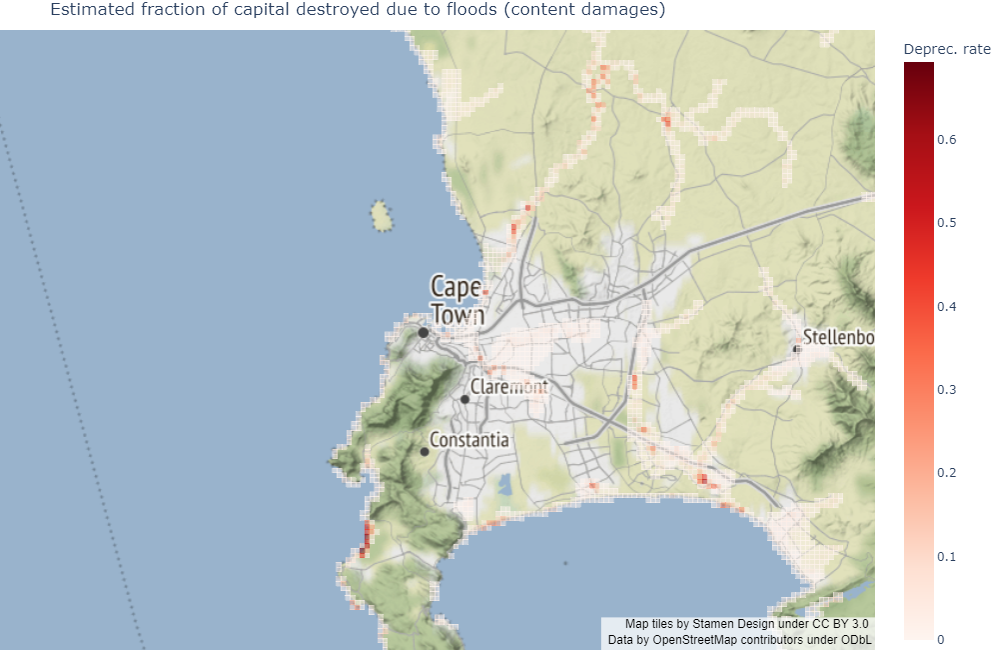

In [2]:
Image(path_outputs + 'use_case_anticip/maps/map_fract_K_destroyed.png')

As expected, flood exposure follows the coastline (for coastal flood risks), waterways (for fluvial flood risks), and topological depression areas (for pluvial flood risks). The distribution of its intensity is not obvious a priori however. Note that this map of capital depreciation due to floods is only a first step towards quantifying damages, as their final value will also depend on the housing choices made by households. Highly exposed but low-density areas such as the West front of the peninsula should feature relatively low total damages. Also note that we used "undefended" flood maps, which do not consider existing infrastructure that may affect the spatial distribution of flood risks. This is why, in what follows, we prefer to interpret our results in changes, rather than in levels. This will answer the following question: all else equal (including existing infrastructure), what is the impact of a change on a given dimension (for instance, flood risk anticipation) over the outcomes of the model? 

In the model, geography is also defined by several other factors, namely land availability per housing type, location-specific amenities (with an added disamenity factor for informal housing), and income net of commuting costs in each grid cell (accounting for the distribution of commuters across job centers for different income groups). Although they do not play a key role in this specific use case, we plot some of these factors for reference as they influence households' endogenous location decisions: we start with the estimated amenity index, then plot the *expected* income net of commuting costs for each income group in the model (1 being the poorest and 4 being the richest).

We would like to underline that, although land availability (not plotted) is purely **exogenous** in the model, amenities and incomes are **calibrated** factors: the amenity index is estimated to fit the existence of local exogenous amenities (proximity to the ocean, slope, etc.), and incomes net of commuting costs are estimated to fit the exogenous number of jobs in each employment center (185 in the model), according to commuting choice theory. It is worth noting that such calibrated incomes do not correspond to observed income levels, but are theoretical constructs informative of agents' location choices: they correspond to the best income agents could get should they choose to locate in any given area.

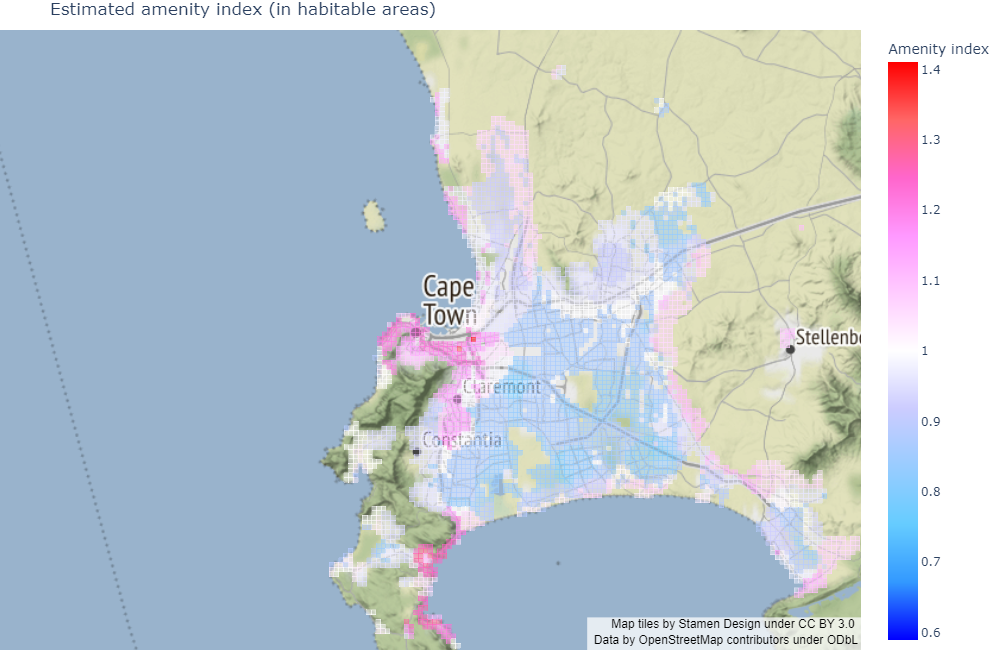

In [3]:
Image(path_outputs + 'use_case_anticip/maps/map_amenities.png')

As expected, we find high amenity values in the city centre and in specific areas that are well-endowed by nature.

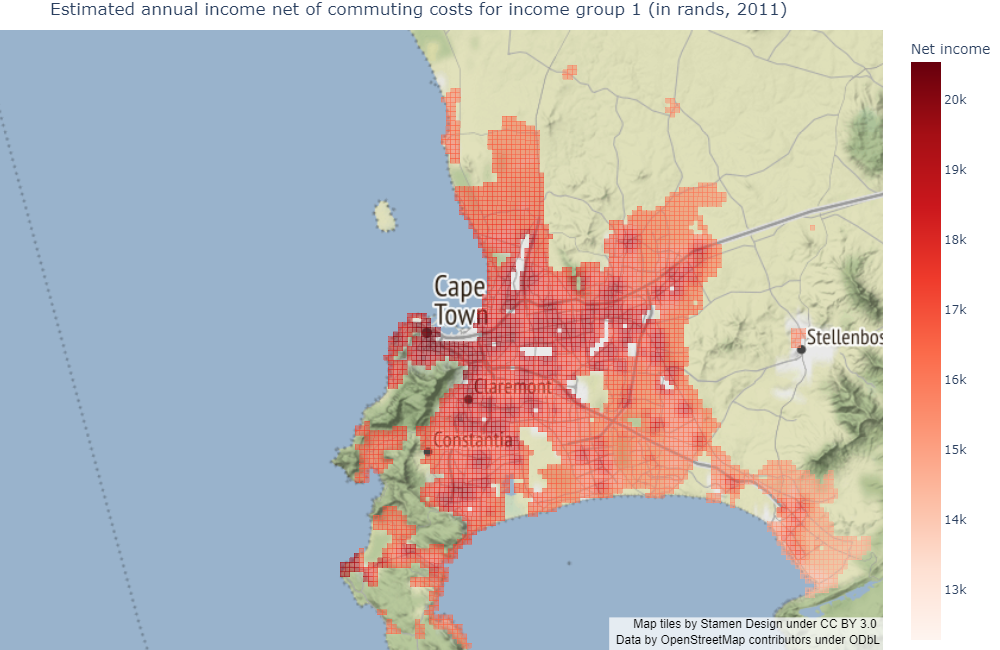

In [4]:
Image(path_outputs + 'use_case_anticip/maps/map_netincome_1.png')

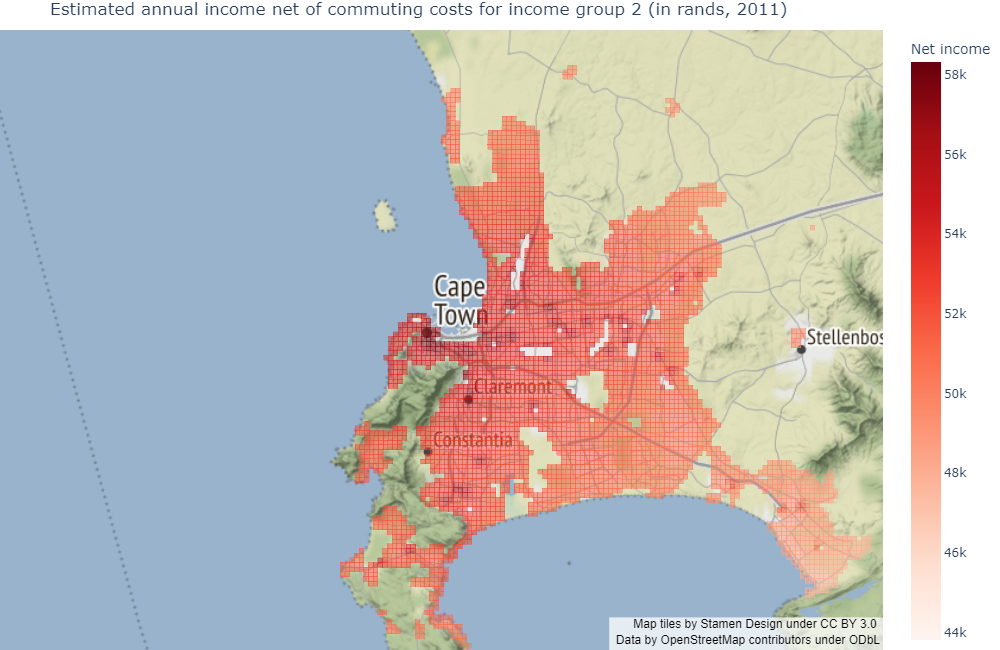

In [5]:
Image(path_outputs + 'use_case_anticip/maps/map_netincome_2.png')

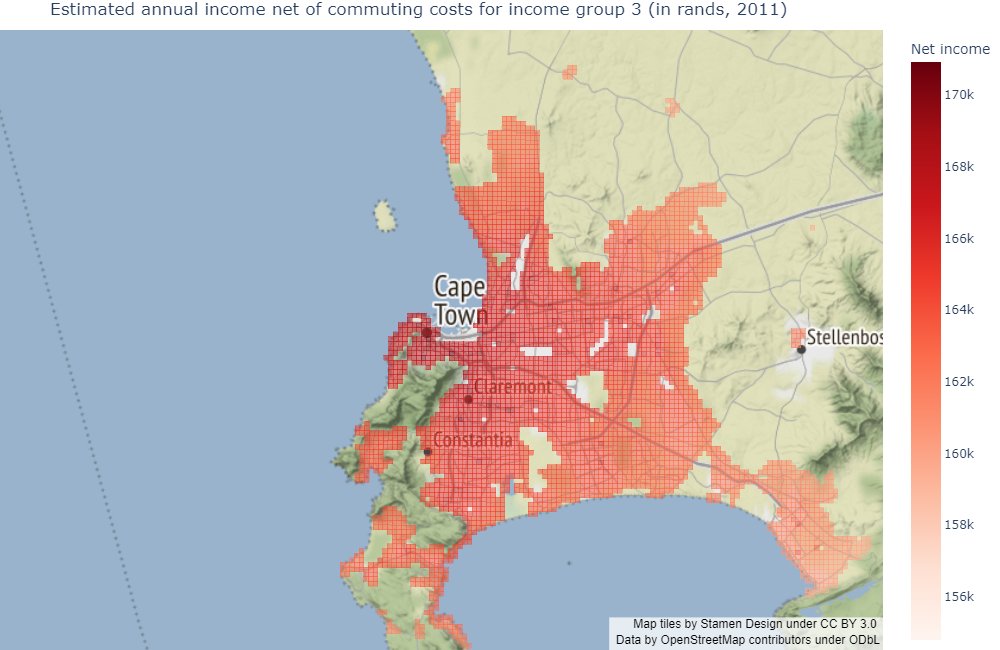

In [6]:
Image(path_outputs + 'use_case_anticip/maps/map_netincome_3.png')

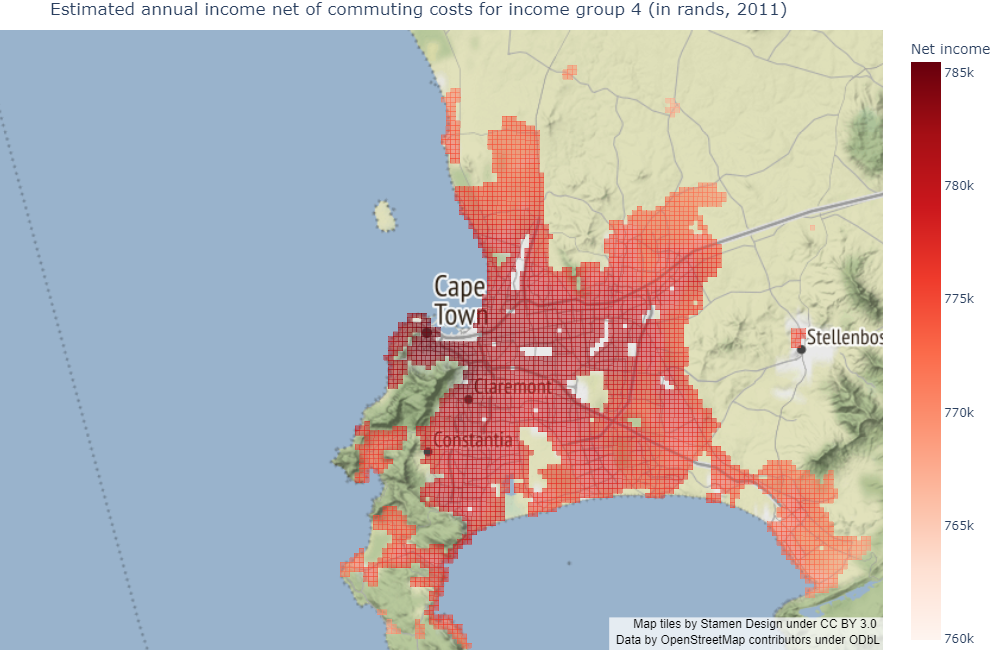

In [7]:
Image(path_outputs + 'use_case_anticip/maps/map_netincome_4.png')

Due to commuting, the maps show a negative income gradient around job centers, which correspond to heat zones. Also note that relative spatial variations in net income are smaller for the richer groups as commuting represents a lower fraction of their income.

We now focus on results from simulation of the model, starting with aggregated flood damages. We refer the reader to the technical documentation for a complete review of how the model works.

#### Aggregate damages

We plot below the distribution of aggregate annual damages across housing and damage types, comparing our two polar cases, for each flood type. 

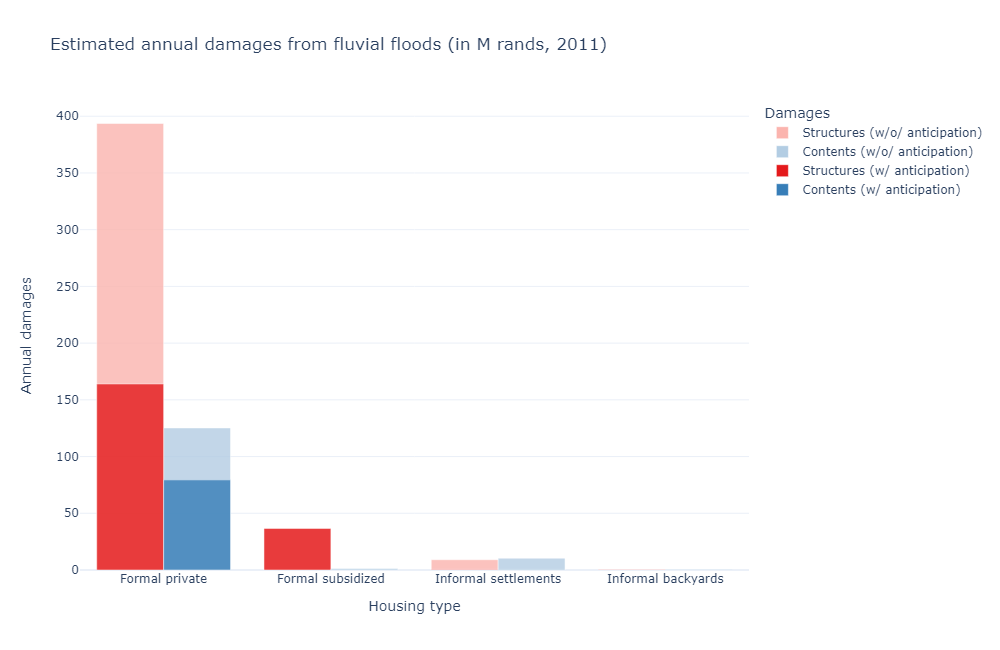

In [8]:
Image(path_outputs + 'use_case_anticip/charts/fluvialu_sim_damage_sum_anticip.png')

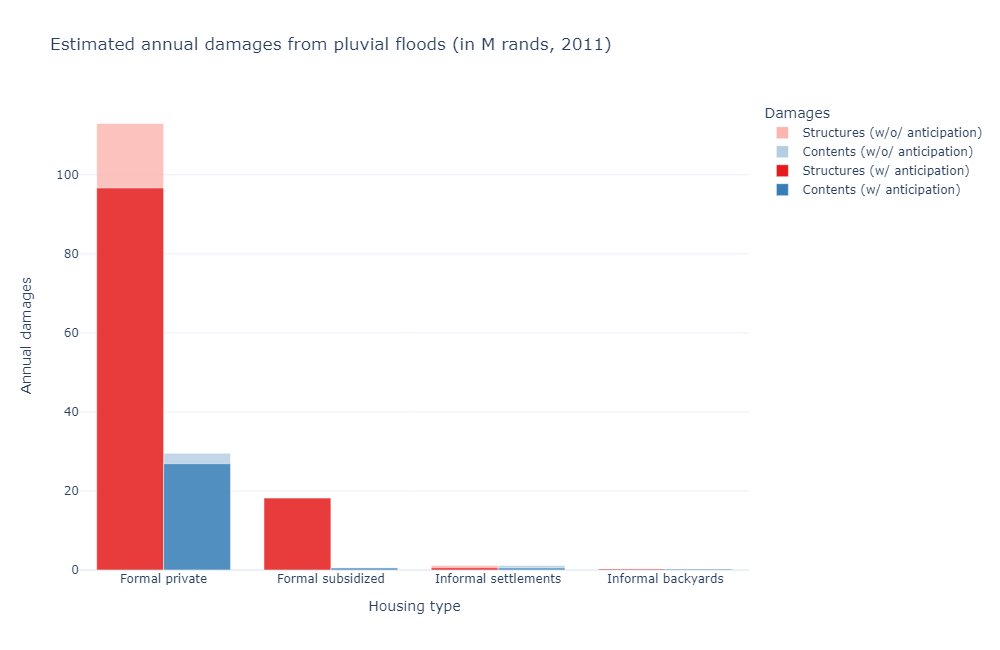

In [9]:
Image(path_outputs + 'use_case_anticip/charts/pluvial_sim_damage_sum_anticip.png')

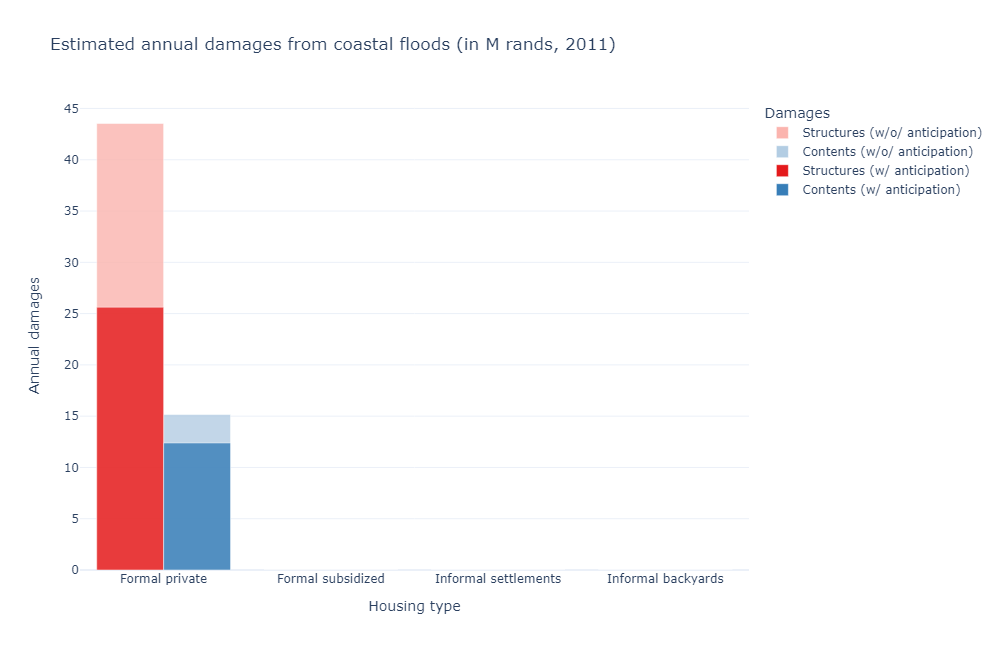

In [10]:
Image(path_outputs + 'use_case_anticip/charts/coastal_sim_damage_sum_anticip.png')

Several comments are in order. First, damages in formal housing are consistently larger than in informal housing, and damages to structures also tend to outweigh damages to contents. This is because the replacement cost of informal settlements and backyard structures is **calibrated** based on construction costs and is fairly low (hence the relative importance of contents in this category). Formal private housing on the other hand is built according to higher and more costly standards per sq.m and will typically use land more intensively in attractive locations such that buildings can be tall and capital intensive, meaning that their replacement costs are high. In addition, the bulk of the population lives in formal private housing, hence a larger overall exposure in flood-prone areas. As a result, the aggregate damages (replacement costs) for formal private housing structures are higher when compared to damages (replacement costs) for informal housing and backyard structures, despite the latter’s higher vulnerability to floods (share of the property damaged when a flood hits). The replacement cost of formal subsidized housing structures is also **calibrated** based on construction costs but is typically higher than for informal housing. Finally, the population living in formal private housing is essentially made up of households belonging to the two richest income groups, with the two poorest concentrating in the other housing categories. Their higher amount of income available for consumption explains the relative importance of content damages in this category.

Second, damages are higher in the no-anticipation case than in the perfect-anticipation case. This is to be expected. Anticipation also seems to play a relatively more important role in avoiding damages in the formal private housing sector. This can be explained by the fact that it is the least constrained of the housing submarkets, either in terms of available locations, or restriction on supply and demand. What is more surprising is the contrasted role anticipation seems to play across flood types. Again, this can be interpreted in terms of existing constraints: pluvial flood zones are typically more dispersed than fluvial or coastal flood zones, hence are harder to avoid (the extensive margin). Independently, coastal flood zones are typically more attractive, hence a floor below which demand would not fall.

Third, damages also significantly vary in their magnitude across flood types:

- Total fluvial damages amount to roughly 280M ZAR (2011) with anticipation and 570M ZAR (2011) without anticipation (**+104%**)
- Total pluvial damages amount to roughly 145M ZAR (2011) with anticipation and 165M ZAR (2011) without anticipation (**+14%**)
- Total coastal damages amount to roughly 50M ZAR (2011) with anticipation and 75M ZAR (2011) without anticipation (**+50%**)

Using an inflation rate of 64% over the 2011-2021 period, and an exchange rate of 14.78 ZAR/USD, we obtain the following equivalent amounts:

- Total fluvial damages amount to roughly 31M USD (2021) with anticipation and 63M USD (2021) without anticipation
- Total pluvial damages amount to roughly 16M USD (2021) with anticipation and 18M USD (2021) without anticipation
- Total coastal damages amount to roughly 6M USD (2021) with anticipation and 8M USD (2021) without anticipation

For comparison, a 2021 internal report by the World Bank ("Flood Risk and Resilience of Coastal Cities in Sub-Saharan Africa") gives estimates of 16M USD for rainwater (both fluvial and pluvial) flood damages, and 370,000 USD for coastal flood damages. The difference between these estimates and ours is essentially a question of methodology. In our case, due to partial overlap, an exact estimation of rainwater flood damages cannot be obtained as the sum of fluvial and pluvial flood damages. Taking the maximum between the two in each grid cell (a conservative approach), we obtain an estimate of 389M ZAR (2011) / 43M USD (2021) with anticipations, and 675M ZAR (2011) / 75M USD (2021) without anticipations (+74%). This is still a substantial overestimation for both flood types, especially coastal.

The key difference lies in the way the replacement cost of vulnerable assets is estimated. The report uses satellite imagery to determine the extent of urban exposure and multiplies this area by a (unique) maximum unitary damage value per m². Final damage estimates are then obtained by applying the depth-damage function to this total maximum value in each location. In contrast, urban extent and replacement cost of underlying structures and contents are endogenous outcomes in the model: the city can be built on several floors, underlying capital values are heterogeneous due to construction technology used, and they can become very high in attractive areas. In fact, we find a total replacement cost for formal private housing structures that is very close to the report's estimate of the total exposed capital value of the city: since this is the housing category that drives most of the damages in absolute terms, the reason our results differ boils down to the way those values are distributed across the city in the model (they are typically high along the coast and in some flood-prone zones where there is high demand) and the value of associated contents, which could have been underestimated using the report's methodology.

#### Spatial distribution of absolute damages

We now look at how absolute damages are distributed across space.

First, in the perfect-anticipation case:

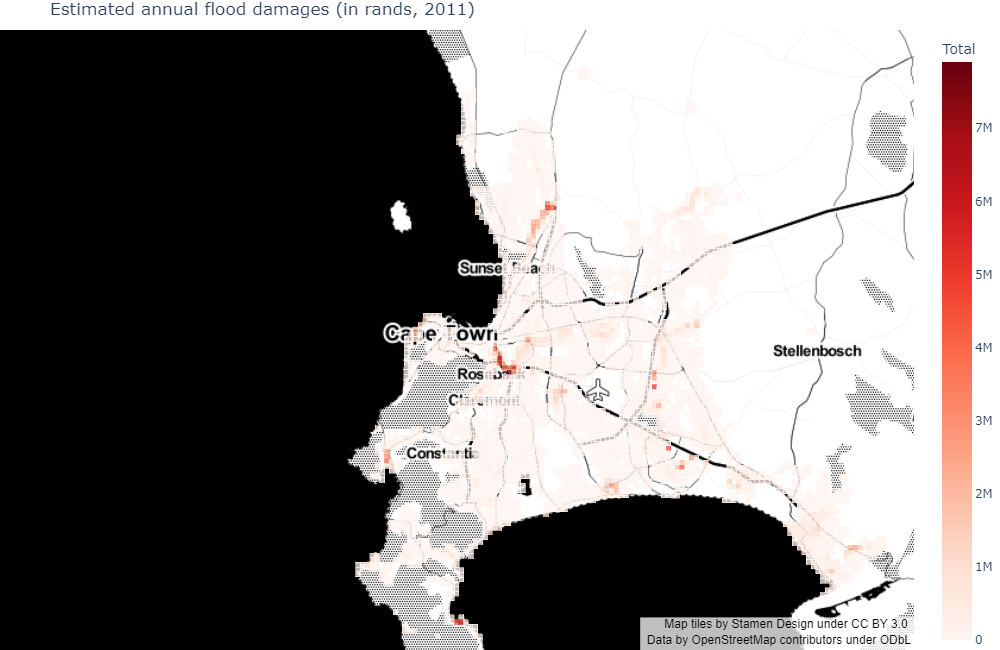

In [11]:
Image(path_outputs + 'use_case_anticip/maps/abs_damages/map_damages_anticip.png')

Then, in the no-anticipation case:

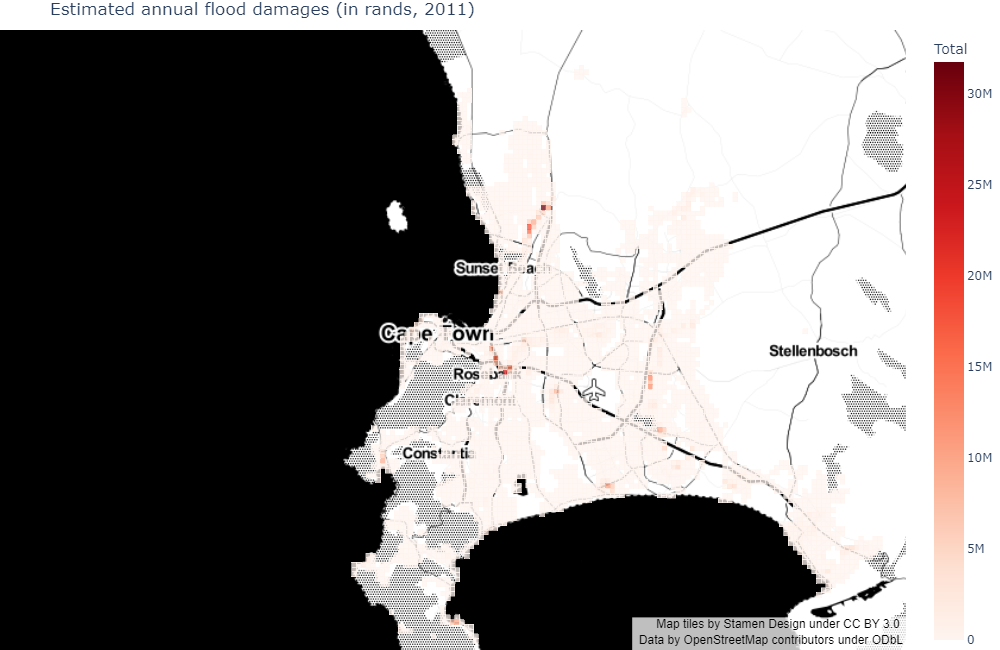

In [12]:
Image(path_outputs + 'use_case_anticip/maps/abs_damages/map_damages_noanticip.png')

Finally, comparing the two:

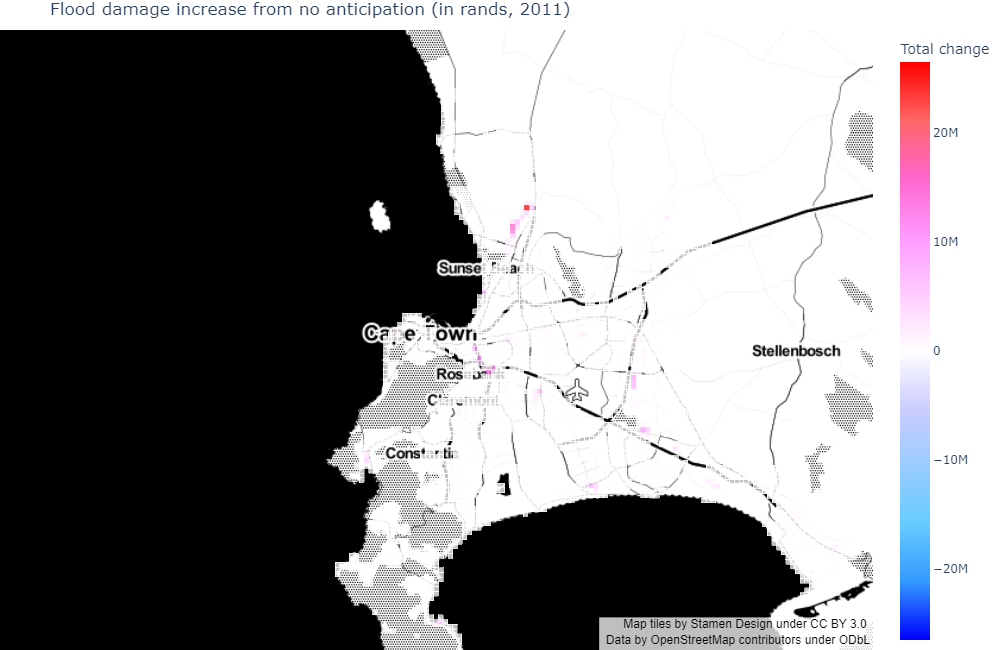

In [13]:
Image(path_outputs + 'use_case_anticip/maps/abs_damages/map_damages_compar_anticip.png')

As expected, damages are higher in the no-anticipation case. In both cases, their spatial distribution roughly follows the distribution of flood exposure in populated areas (as will be made clear below). Also, the adjustment between the two essentially occurs in fluvial flood zones and some coastal ones, in the formal private sector.

#### Spatial distribution of relative damages

What is not apparent in the above figures are the welfare consequences of flood risks. In the perfect-anticipation case, due to the spatial indifference condition that holds in equilibrium, all households belonging to the same income group share a common utility level (with higher values as we climb the income ladder). Ex-ante, the same applies to the no-anticipation case, with utility levels that are higher for all income groups since households believe that they live in a no-flood world. Ex-post, the discovery of the flood damages associated with their location and housing choices differentially affects their utilities (which will be typically lower than in the perfect-anticipation case for affected households). The spatial indifference condition only holds ex ante but not ex post  as we do not allow households to residentially sort again after they have been hit by flood risks.

It is worth noting that, from a theoretical point of view, the difference in utility levels across scenarios should not be quantitatively interpreted: we may simply say that some households are made worse off or better off comparing across scenarios. 

As a quantitative measure of how households are affected by floods, we report below damage costs as a share of *realized* net income, comparing the perfect-anticipation and no-anticipation cases. We report results separately for the different housing types (as their vulnerability to floods differs).

Please note that the maps allow to compare damages in given locations, but the numbers and types of households and dwellings varies in these locations when comparing the perfect-anticipation and no-anticipation cases. We do not show plots for formal subsidized housing as their location is exogenous in the model, hence no changes occur across scenarios.

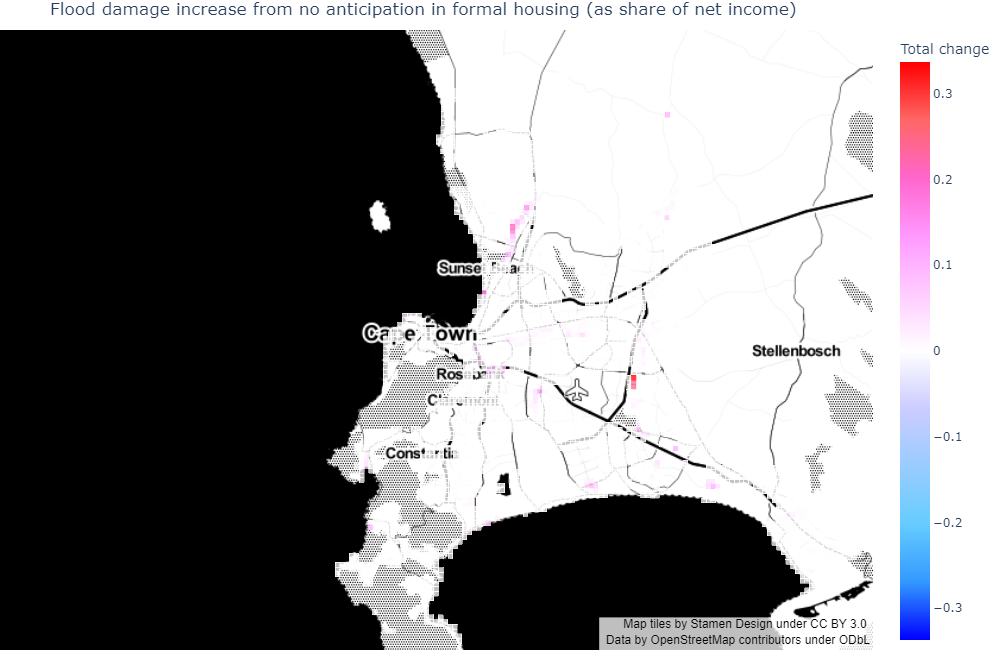

In [14]:
Image(path_outputs + 'use_case_anticip/maps/rel_damages/formal/map_damages_compar_formal.png')

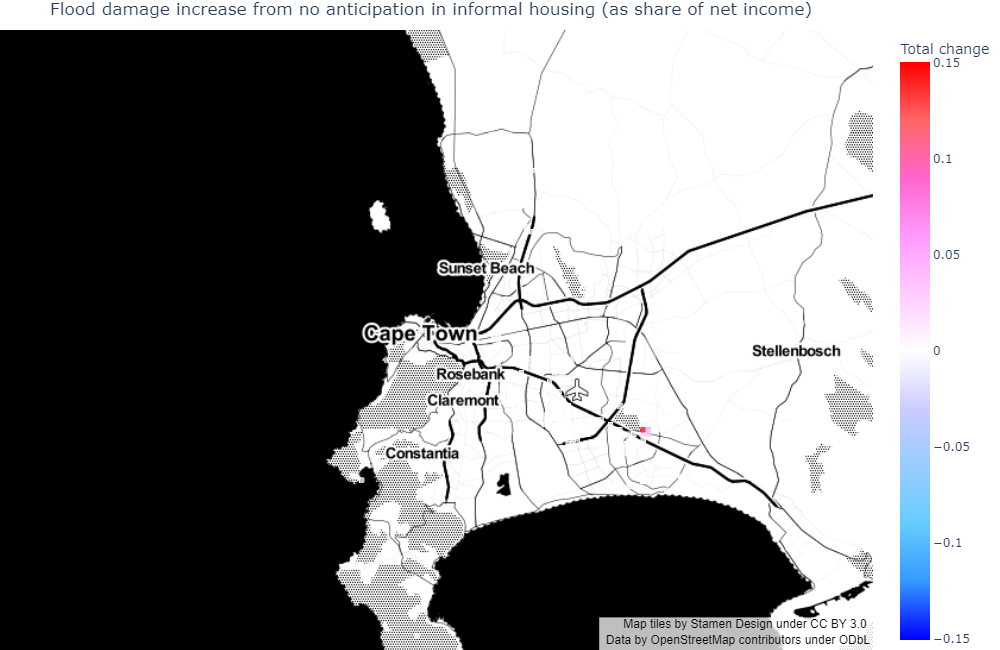

In [15]:
Image(path_outputs + 'use_case_anticip/maps/rel_damages/informal/map_damages_compar_informal.png')

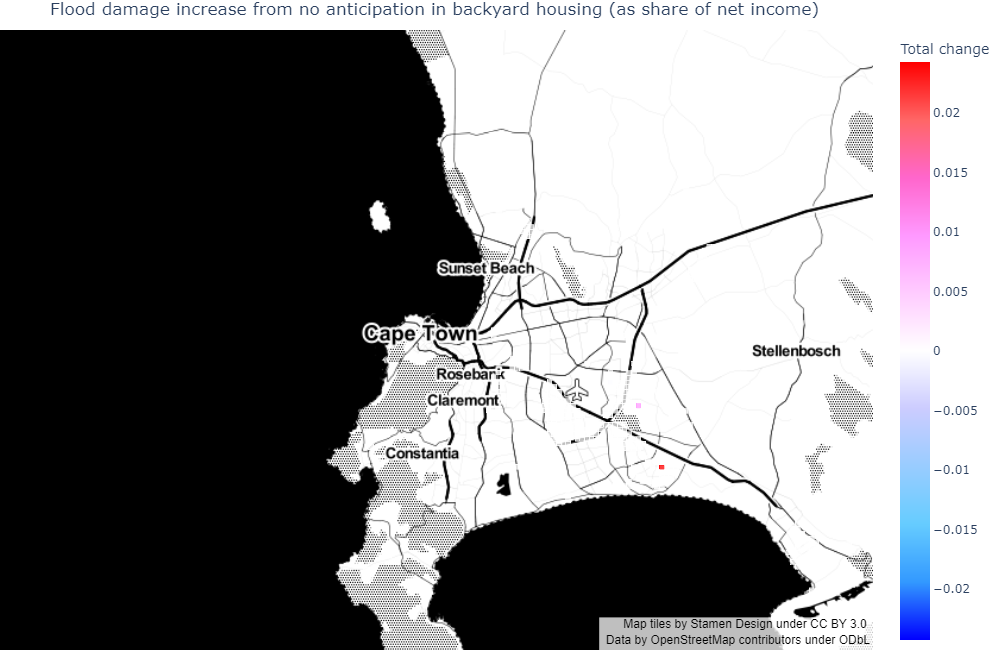

In [16]:
Image(path_outputs + 'use_case_anticip/maps/rel_damages/backyard/map_damages_compar_backyard.png')

As expected, the change in flood damages is mostly positive when substracting outcomes in the perfect-anticipation case from outcomes in the no-anticipation case (i.e., flood damages are mostly greater in the no-anticipation case). The corresponding losses (in terms of net income shares) follow the spatial distribution of total absolute damages for formal private housing, with a relative peak East of the airport where income group 2 (the second poorest) lives, and a relative trough near Rosebank where income group 4 (the richest) lives.

Households living in formal private housing also seem to suffer the most (in relative terms) from flood damages. This should be qualified however: although both structure and content damages have been included for the sake of comparability across maps, households living in formal private housing directly only pay for content damages in the model (as damages on structures are internalized by developers). Taking only content damages into account, a quick look shows that relative damage exposure is in fact comparable to that of households living in informal settlements. Still, changes in rents would capture part of structural damages in the formal private sector, so that we can take the map displayed for formal private housing as an upper bound on relative damages for the population subgroup who lives in such housing.

Damages concentrate in the area East of Driftsands Nature Reserve for informal settlements, where income group 1 (the poorest) lives and flood risk exposure is important. The same analysis applies to informal backyard structures located North and South of the reserve (with a lower order of magnitude).

Fluvial flood risks are the most important damage factor, even in relative terms.

#### Summary welfare statistics

Here, we plot the aggregate distribution of relative flood damages per income group. Since there is a high mass of households who do not live in flood-prone areas, the graphs only consider the subpopulation living in areas with a positive risk of floods. In the interest of space, we only show results for fluvial flood risks (since they are the most impactful).

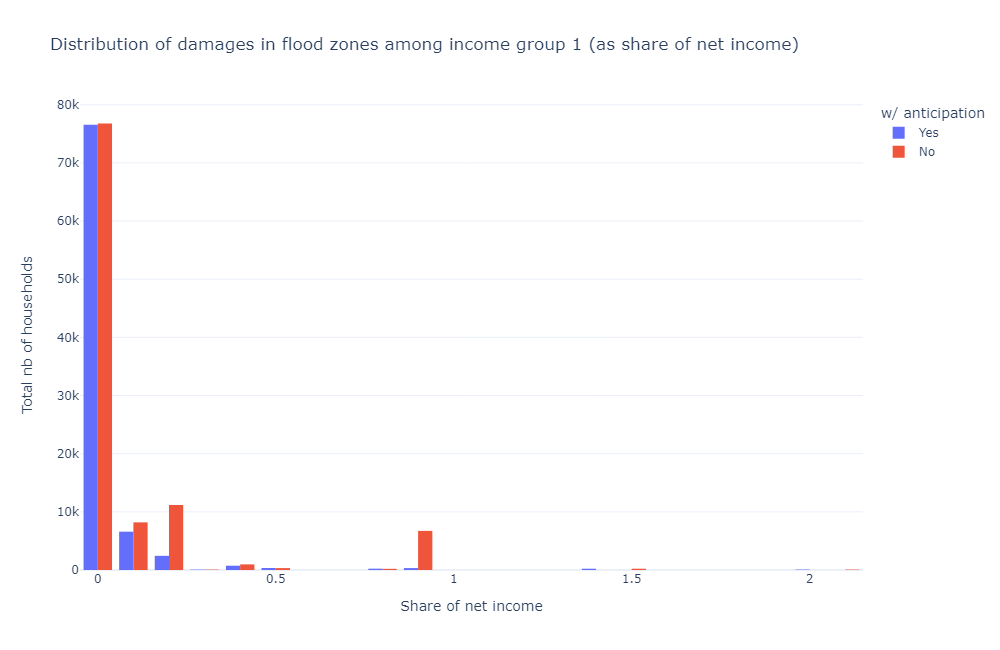

In [17]:
Image(path_outputs + 'use_case_anticip/charts/damage_distrib/total/fluvialu_damage_dist_1_anticip_sum.png')

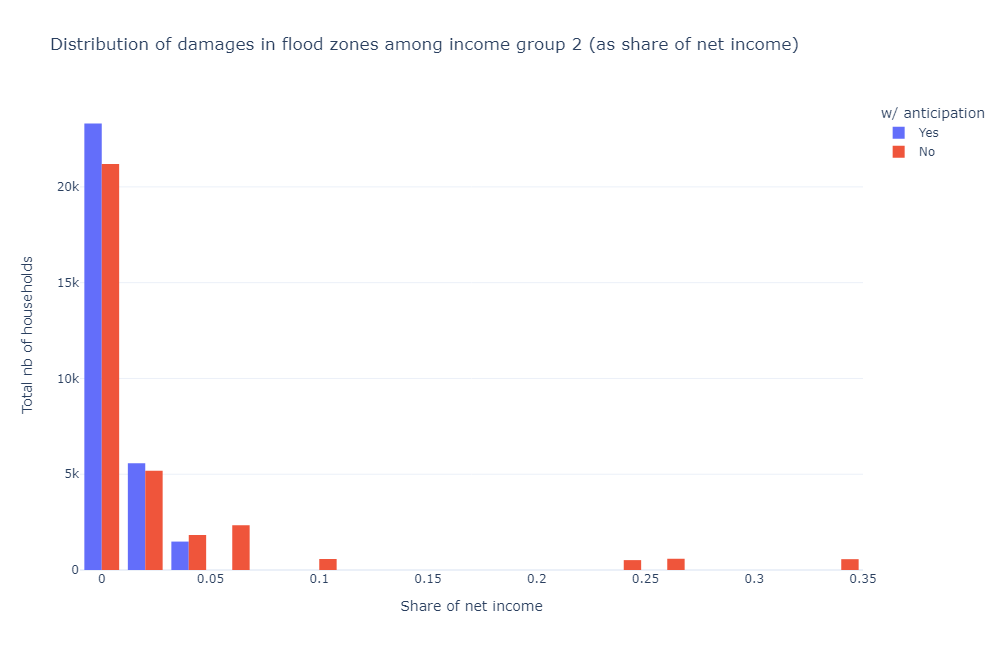

In [18]:
Image(path_outputs + 'use_case_anticip/charts/damage_distrib/total/fluvialu_damage_dist_2_anticip_sum.png')

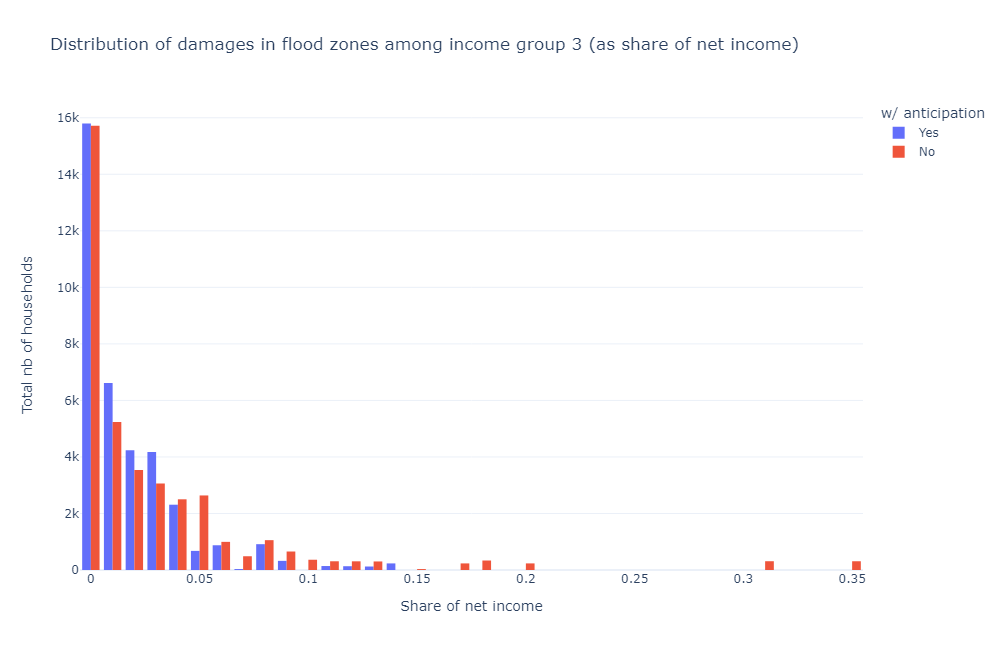

In [19]:
Image(path_outputs + 'use_case_anticip/charts/damage_distrib/total/fluvialu_damage_dist_3_anticip_sum.png')

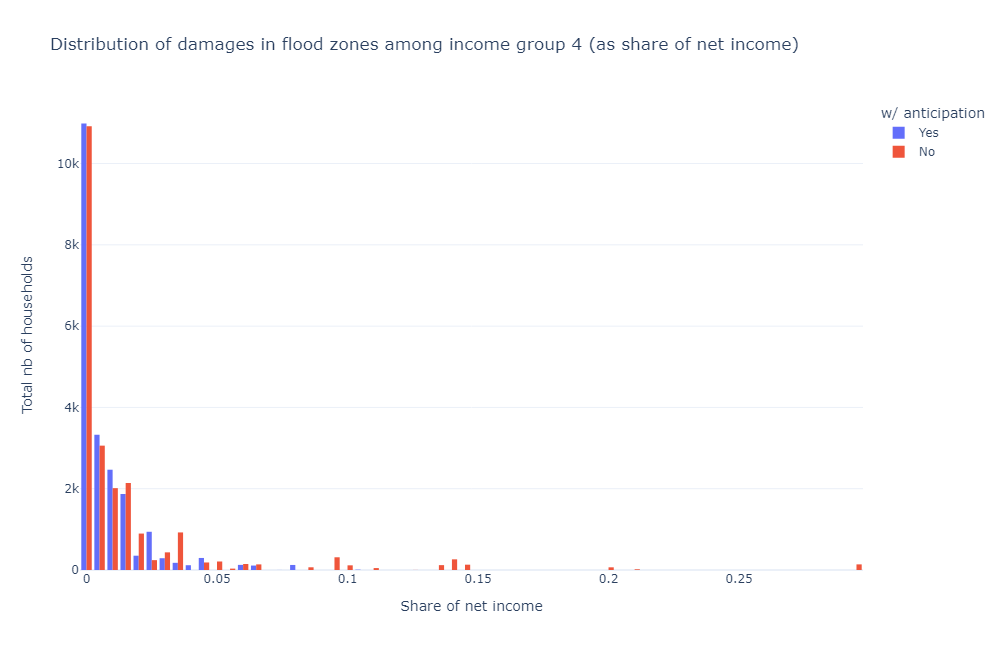

In [20]:
Image(path_outputs + 'use_case_anticip/charts/damage_distrib/total/fluvialu_damage_dist_4_anticip_sum.png')

- Overall exposure to flood risks decreases with income (conditional on income group population), even when flood risks are not considered by agents (no-anticipation case). This corresponds to the intuition that flood-prone areas are typically low-amenity areas located far from (high) income centres, as public services and economic activity historically developed away from them.
- More counter-intuitively, the tail of flood vulnerability does not necessarily become thinner as income increases. This is because, as marginal utility decreases with income, richer households may prove less sensitive to income changes. Hence, they may be willing to consume more, even at the risk of increased destruction.
- The very long (but thin) tail of flood damages for income group 1 (with some households losing more than 100% of their income) is due to a few households living in formal subsidized housing that are located in flood-prone areas, as the cost of these structures is relatively high (compared to their income). In practice, this would require authorities to bail out such households.
- When including anticipation, households typically reduce their vulnerability in high-risk flood zones by moving to similar lower-risk flood zones.

More precisely:

- Average damages go from 9.83% of net income (for 104,723 households) to 3.37% (for 87,582 households) for income group 1 (397,395 households in total) between the no-anticipation and perfect-anticipation scenarios. Taking the exposed population in the no-anticipation case as baseline (to include benefits to households who left flood-prone areas entirely), **this translates into a 7.01% gain in net income for 26% of the group population (or a 1.85% gain overall)**.
- Average damages go from 2.57% (for 32,789 households) to 0.60% (for 30,363 households) for income group 2 (172,435 households). **This translates into a 2.01% gain in net income for 19% of the group population (or a 0.38% gain overall)**.
- Average damages go from 3.08% (for 38,620 households) to 1.79% (for 36,593 households) for income group 3 (296,993 households). **This translates into a 1.38% gain in net income for 13% of the group population (or a 0.18% gain overall)**.
- Average damages go from 1.59% (for 22,624 households) to 0.76% (for 21,192 households) for income group 4 (162,676 households). **This translates into a 0.88% gain in net income for 14% of the group population (or a 0.12% gain overall)**.

As expected, the relative welfare gains associated with anticipations decrease with income.

#### Population moves and composition effect

As mentioned before, the above says nothing about the mix between location and housing choice responses leading to those results. We therefore turn to these, under the understanding that we will only be able to make qualitative statements. Indeed, disentangling between both types of response would require following individual households across scenarios: since we do not know which households would move from a given flood-prone area to another, we do not know which part of the associated damage reduction is due to relocation vs. housing consumption adaptation. Note that those responses also affect welfare indirectly through general equilibrium effects.

Let us start with the relocation response.

First, in the perfect-anticipation case:

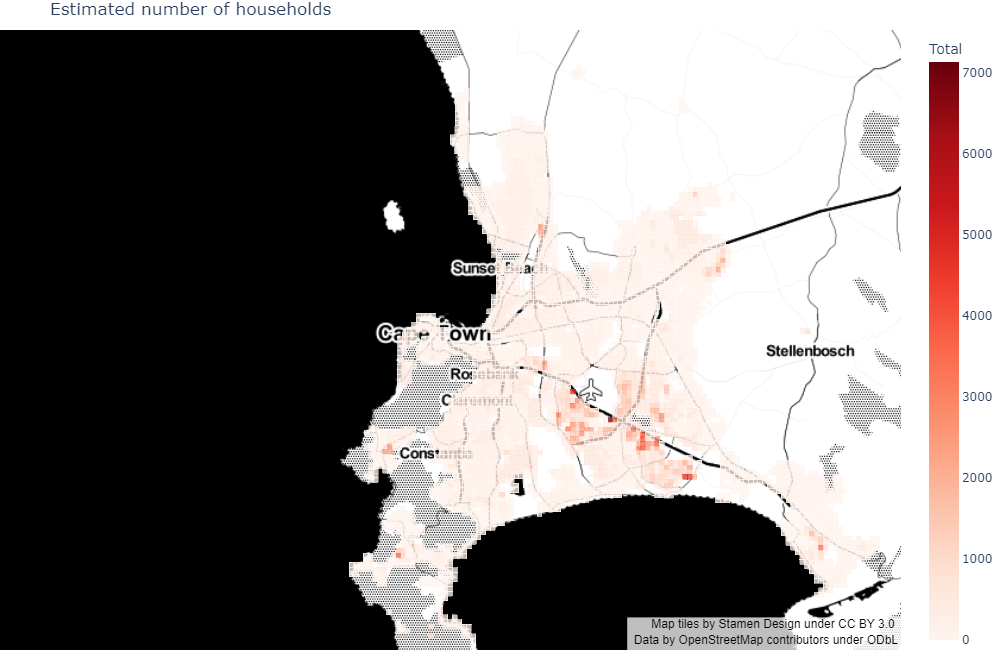

In [21]:
Image(path_outputs + 'use_case_anticip/maps/pop_distrib/map_pop_distrib_anticip.png')

Then, in the no-anticipation case:

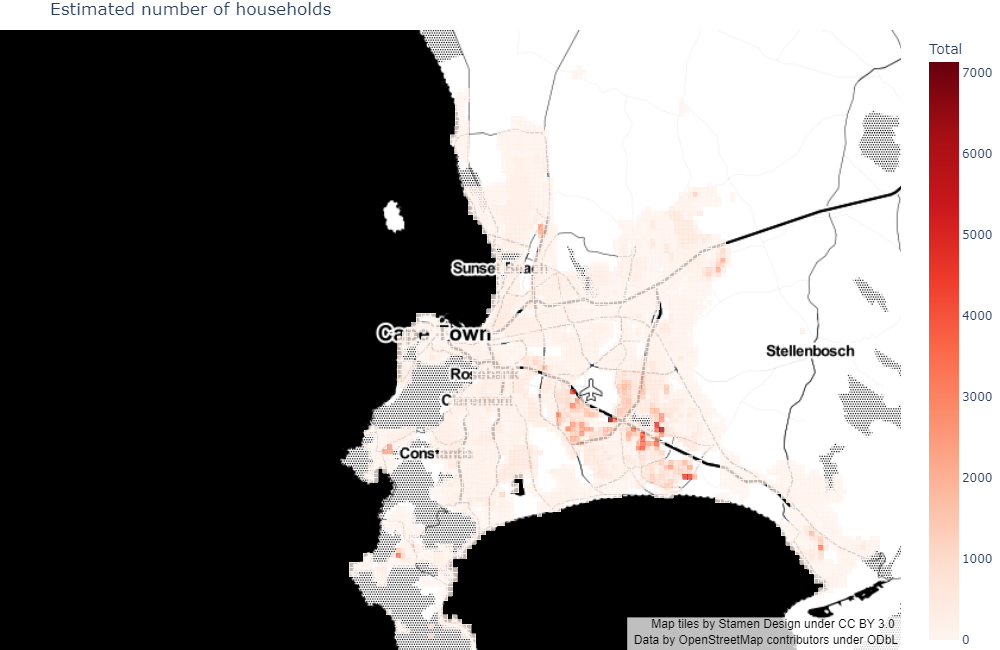

In [22]:
Image(path_outputs + 'use_case_anticip/maps/pop_distrib/map_pop_distrib_noanticip.png')

Finally, comparing the two:

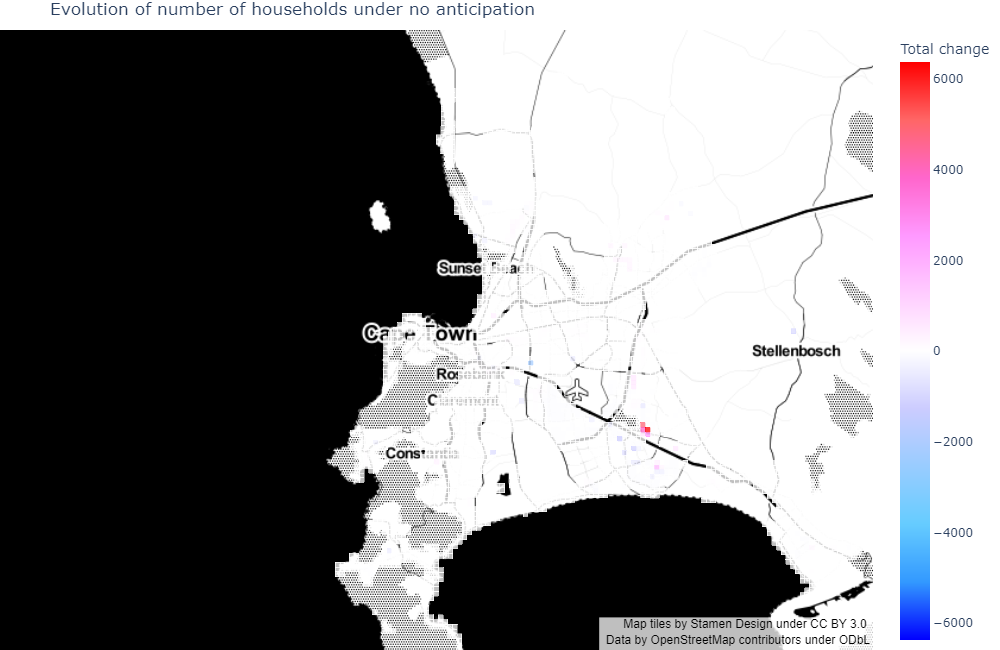

In [23]:
Image(path_outputs + 'use_case_anticip/maps/pop_distrib/map_pop_distrib_compar_anticip.png')

We see that, when introducing anticipations:

- Most population outflows occur in highly vulnerable informal settlements East of Driftsands Nature Reserve (with some areas being completely abandoned), with an isolated move North of Paarlberg Nature Reserve. The effect is more dispersed, but nonetheless important, in formal private housing areas. Most people leaving the Cape Flats belong to income groups 1 and 2, while people from other suburbs tend to belong to income group 3.
- Population inflows are more dispersed across Khayelitsha and in-between neighbourhoods (informal settlements and some formal private housing), plus isolated moves into Stellenbosch, Grabouw, and Atlantis (informal settlements).

Although we cannot follow individual households, here is a tentative interpretation. Poor households (most of them living in informal settlements) are very constrained. Therefore, they may need to move far away from their original locations to offset their losses, hence the high dispersion observed. Richer households, in contrast, may afford to move closer to their original locations.

The relocation response plays a significant role in observed damage reduction (when introducing anticipations) for the two poorest income groups, but less so for the richest ones.

#### Spatial sorting determinants and consumption adaptation

Let us now turn to the determinants of observed spatial sorting, which will also explain the housing consumption response. To do so, let us look at the change in rents across scenarios.

NB: We do not plot formal subsidized housing as it rented out / sold for free in the model.

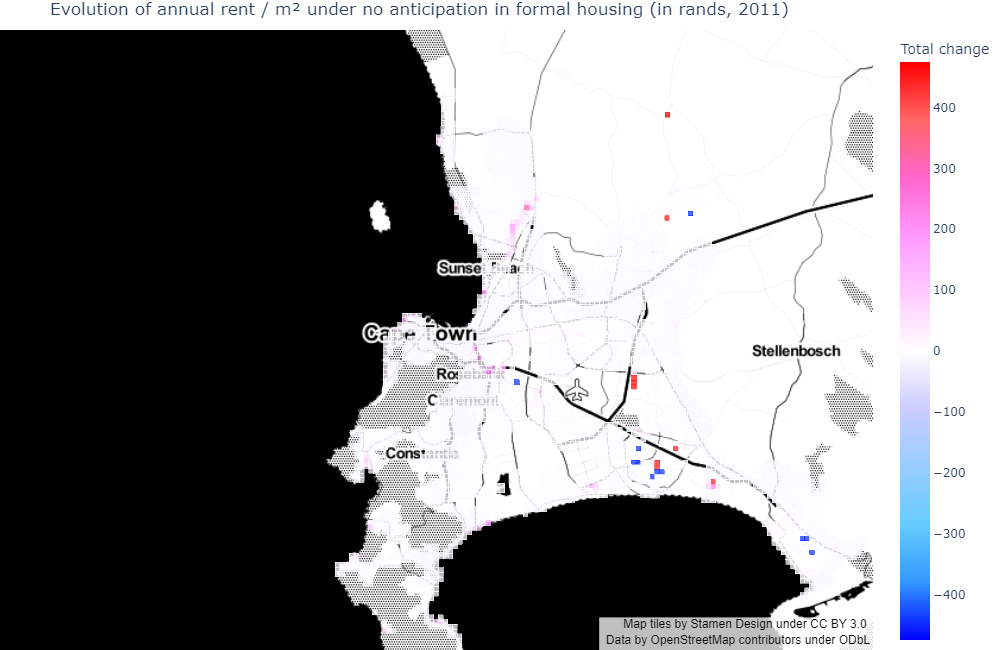

In [24]:
Image(path_outputs + 'use_case_anticip/maps/rent_distrib/formal/map_rent_distrib_compar_anticip_formal.png')

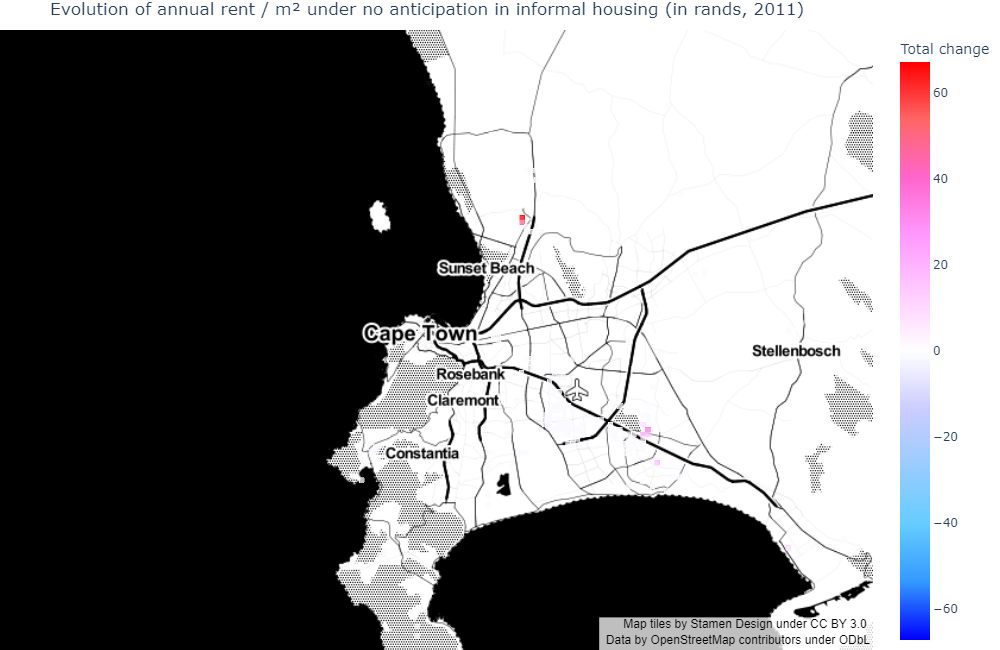

In [25]:
Image(path_outputs + 'use_case_anticip/maps/rent_distrib/informal/map_rent_distrib_compar_anticip_informal.png')

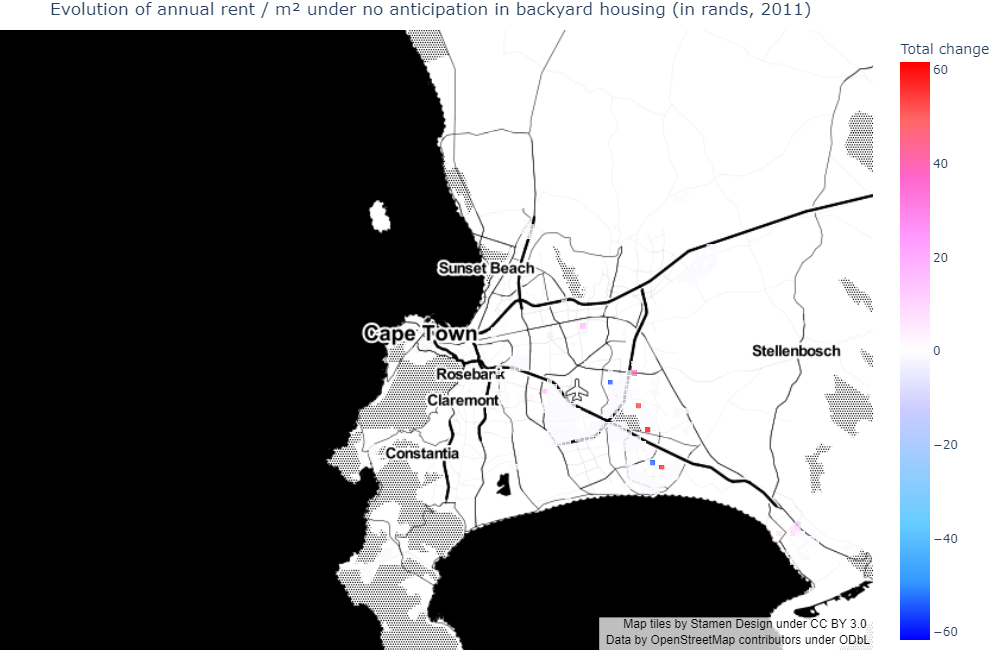

In [26]:
Image(path_outputs + 'use_case_anticip/maps/rent_distrib/backyard/map_rent_distrib_compar_anticip_backyard.png')

We see that the areas with the largest changes in rents roughly correspond to population inflow/outflow areas in the Cape Flats and distant suburbs. This makes sense as market rents reflect the willingness to pay of the highest-bidding income groups in the model. As outflow areas typically are high-risk flood zones (compared to inflow areas which typically are not flood-prone areas), this reflects the updated land values after introducing anticipations.

Flood-prone areas closer to the city center (and in some coastal locations) typically feature smaller (yet significant) changes in rents, even when they are as exposed as zones located farther away. This corresponds to the intuition already mentioned that, since those typically are highly attractive areas, demand would not fall below a certain level, all the more so as households living there can afford to pay for flood damages. Consequently, they do not showcase substantial population flows. Population flows and rent changes sometimes even go in the opposite direction, as some households are willing to take advantage of lower rents. Likewise, if a fall in rent typically translates into a rise in housing consumption, it is not always the case (as housing consumption also responds to flood risks).

In fact, relocation and housing consumption responses simultaneously determine changes in rents, hence the difficulty when trying to disentangle between the two. Still, given the spatial distributions of both population flows and rent changes, it seems that rich households (from income groups 3 and 4) adapt more by relocating, compared to poor households (from income groups 1 and 2) who are less mobile and have to adapt their housing consumption instead of moving to a place less exposed to flood risks.

### Climate change

#### Introduction

We now take the perfect-anticipation scenario as our baseline and simulate the effects of climate change. For coastal flood risks, we rely on specific flood maps provided by DELTARES, based upon IPCC's RCP (Representative Concentration Pathway) 8.5 scenario projected onto 2050. Since FATHOM does not provide similar flood maps for rainwater flood risks, we consider dummy scenarios where we multiply all yearly probabilities by 2 (i.e., we divide return periods by 2) for such flood types.

The below map represents the changes in flood capital depreciation for content damages for illustrative purposes.

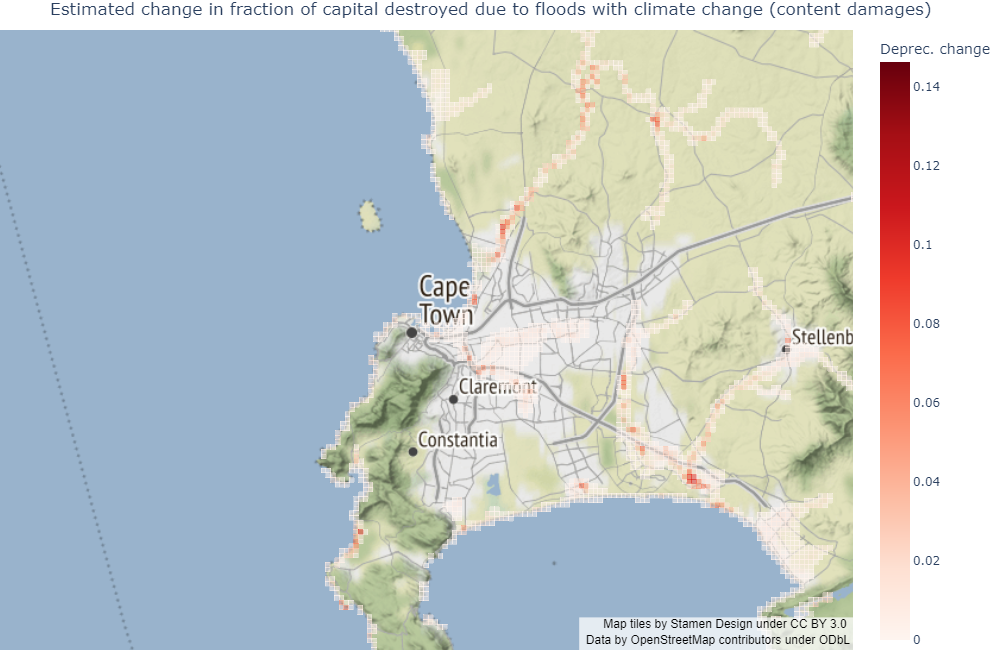

In [27]:
Image(path_outputs + 'use_case_cchange/maps/map_fract_K_destroyed_compar.png')

It should be noted that those scenarios are generally thought of as being relatively pessimistic. Also, we are not focusing on the accuracy of climate change predictions per se, but rather on the general trends climate change may generate in the city.

#### Aggregate damages

As before, we start by plotting aggregate damages per flood type across the two scenarios. Note that we do not consider a climate change scenario without anticipations, since we expect it to yield similar patterns as the standard no-anticipation case, but with higher damage values. Besides, we are more specifically interested in how climate change may affect spatial sorting in the long run, which requires agents to take flood risks into account when making their decisions.

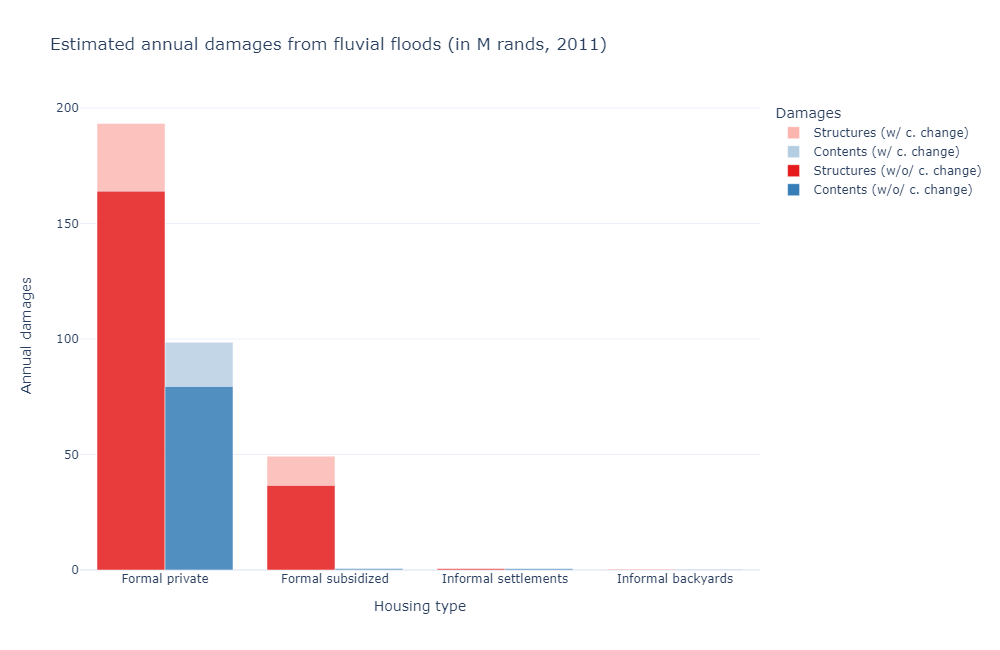

In [28]:
Image(path_outputs + 'use_case_cchange/charts/fluvialu_sim_damage_sum_cchange.png')

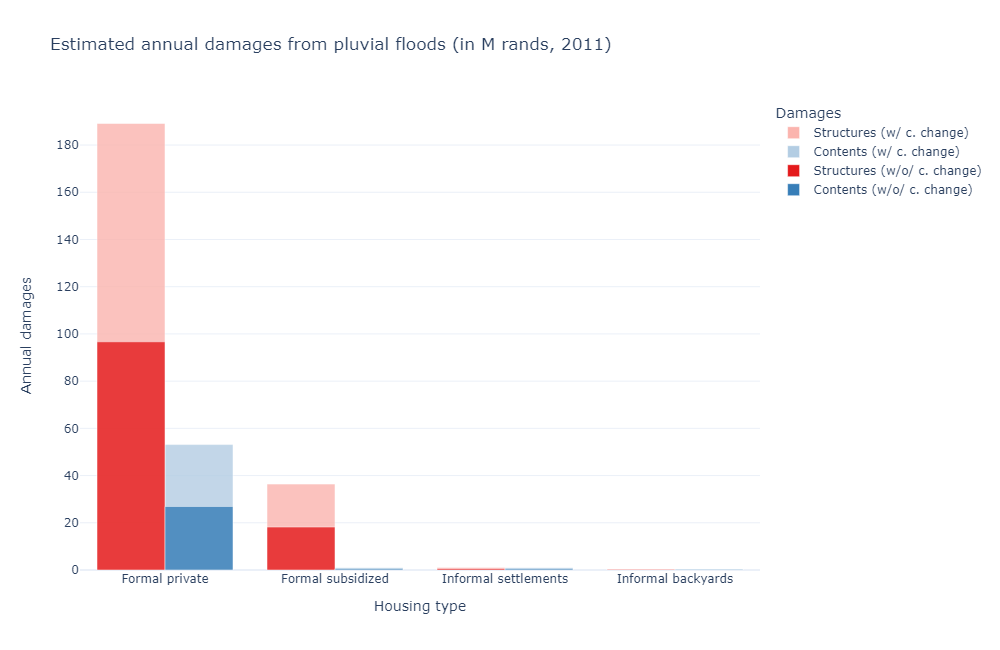

In [29]:
Image(path_outputs + 'use_case_cchange/charts/pluvial_sim_damage_sum_cchange.png')

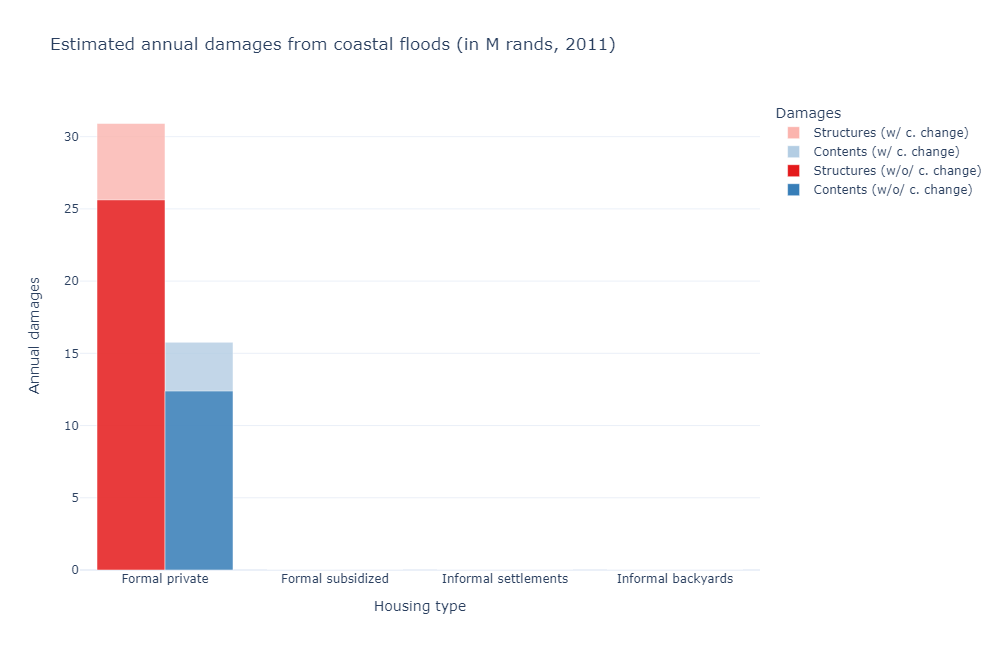

In [30]:
Image(path_outputs + 'use_case_cchange/charts/coastal_sim_damage_sum_cchange.png')

First, we observe that the largest change now occurs for pluvial flood risks, and not fluvial ones. The explanation is the same as before but reversed: since pluvial flood zones are more spread out, climate change there is harder to avoid. Again, coastal flood zones fall in between as they typically are high-value areas where households prefer to adapt their housing consumption rather than their location choice.

#### Spatial distribution of absolute damages

We go on with the spatial distribution of absolute damages.

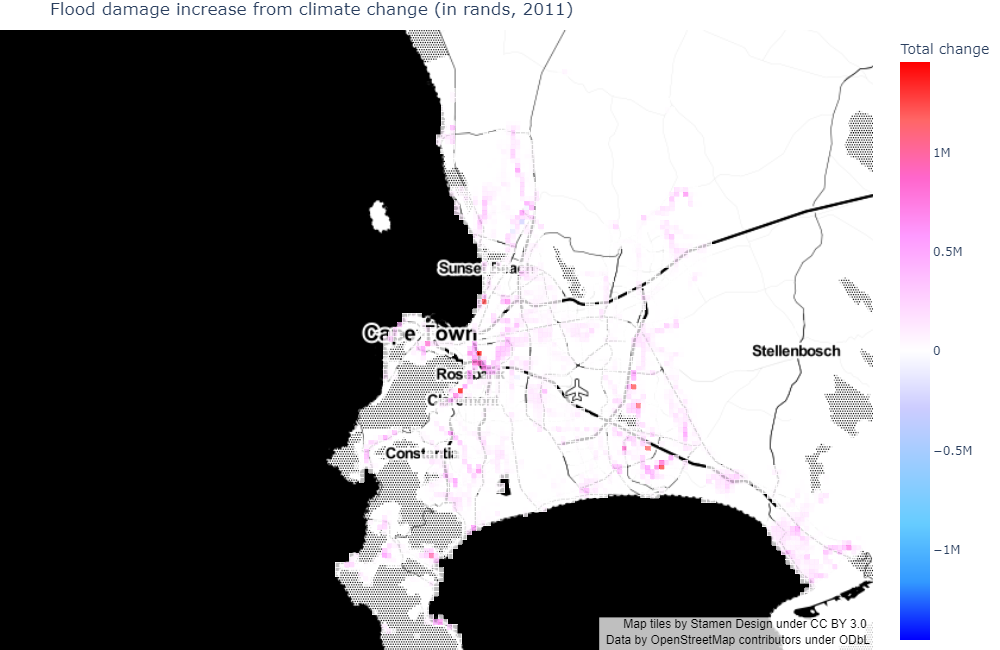

In [31]:
Image(path_outputs + 'use_case_cchange/maps/abs_damages/map_damages_compar_cchange.png')

We observe that the change across scenarios is more widely spread (but also smaller per unit of land) than in the previous use case (which relates to the above interpretation, as pluvial flood risks are also less severe than fluvial ones).

#### Spatial distribution of relative damages

Here, the spatial indifference condition holds in both scenarios, hence we can look at the evolution of utility levels under climate change:
- Households from income group 1 (excluding formal subsidized housing) only see their welfare marginally impacted (in a non-statistically significant way)
- Households from income group 2 are 0.07% worse off
- Households from income group 3 are 0.05% worse off
- Households from income group 4 are 0.05% worse off

Several comments are in order:

- The effects are negative, yet very small. This points to the fact that, when only considering flood monetary impacts on the housing market, climate change may be a secondary issue **once we allow agents to arbitrage in space**. **However, our static simulations say nothing of the time span required for this adaptation to take place**.
- Heterogeneous effects across income groups depend on their relative spatial distribution, which we now focus on.

As before, we therefore plot the spatial distribution of flood damages as a share of net income. We remind the reader that such income losses do not directly translate into utility losses (given above).

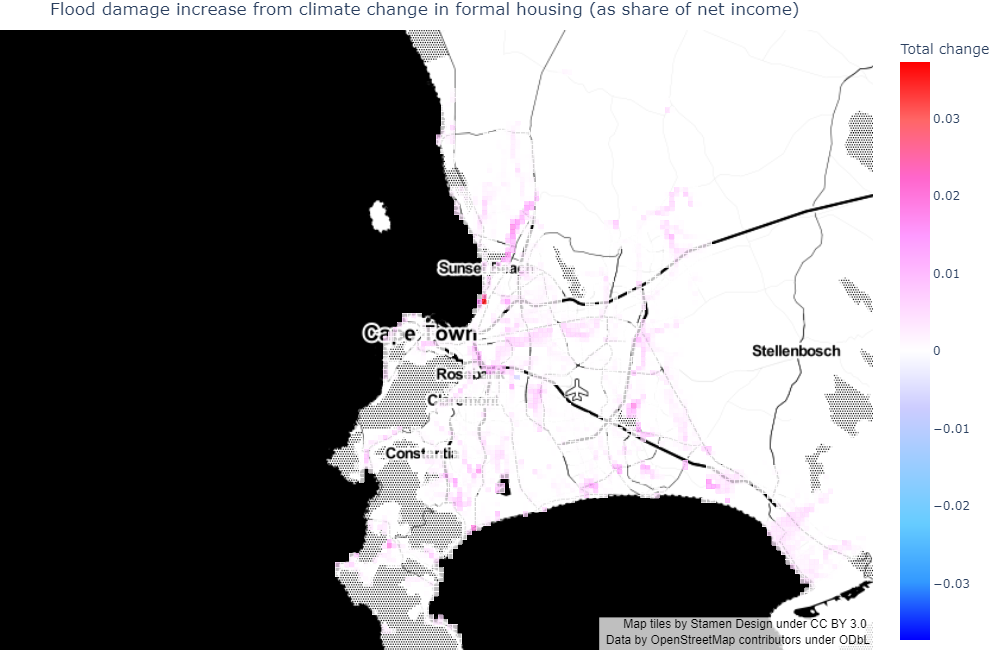

In [32]:
Image(path_outputs + 'use_case_cchange/maps/rel_damages/formal/map_damages_compar_formal.png')

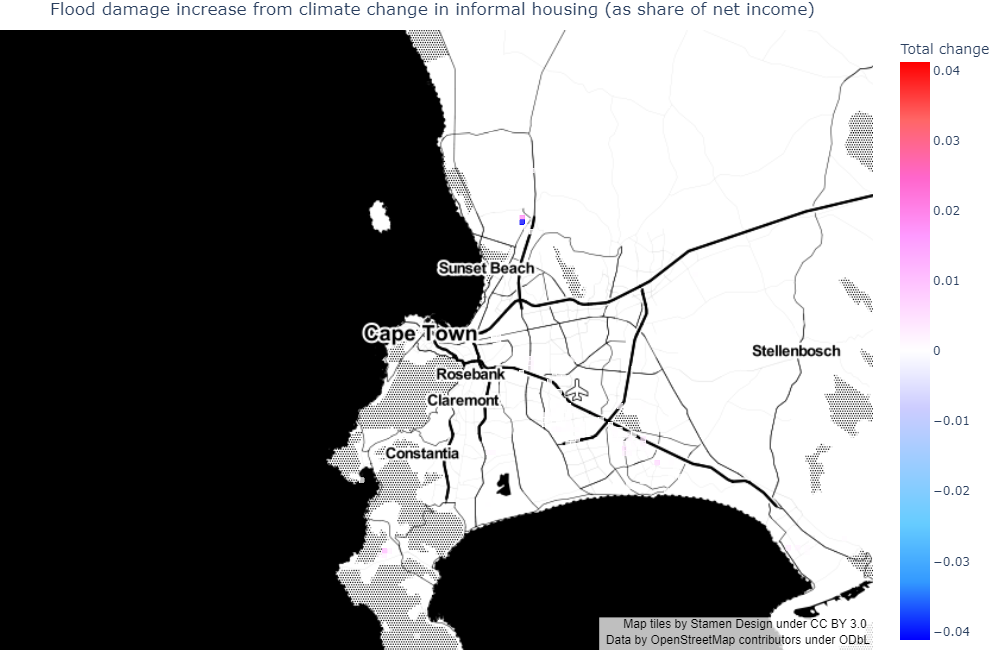

In [33]:
Image(path_outputs + 'use_case_cchange/maps/rel_damages/informal/map_damages_compar_informal.png')

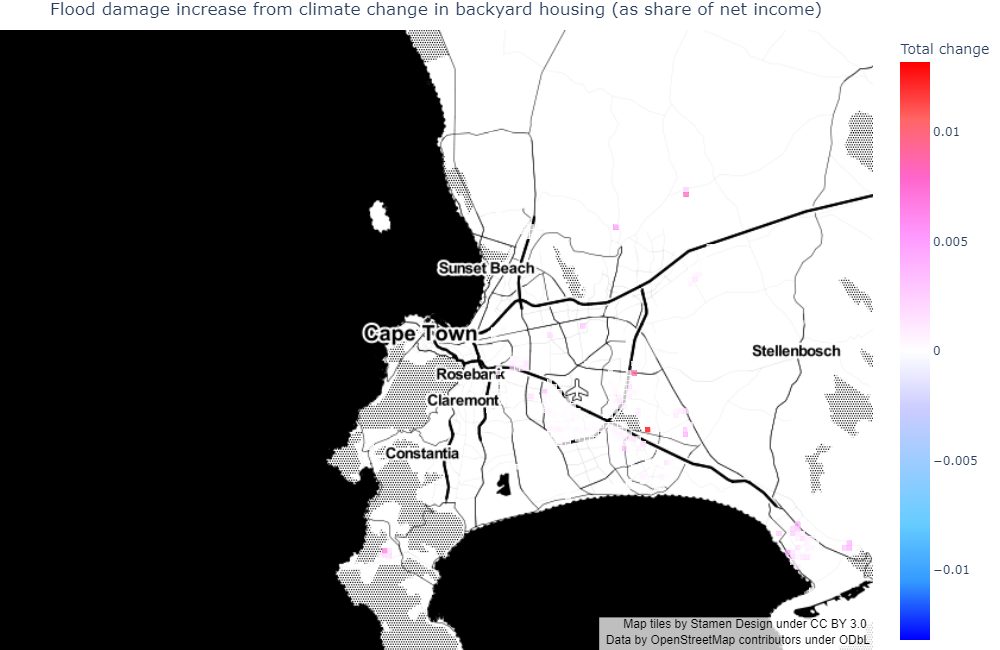

In [34]:
Image(path_outputs + 'use_case_cchange/maps/rel_damages/backyard/map_damages_compar_backyard.png')

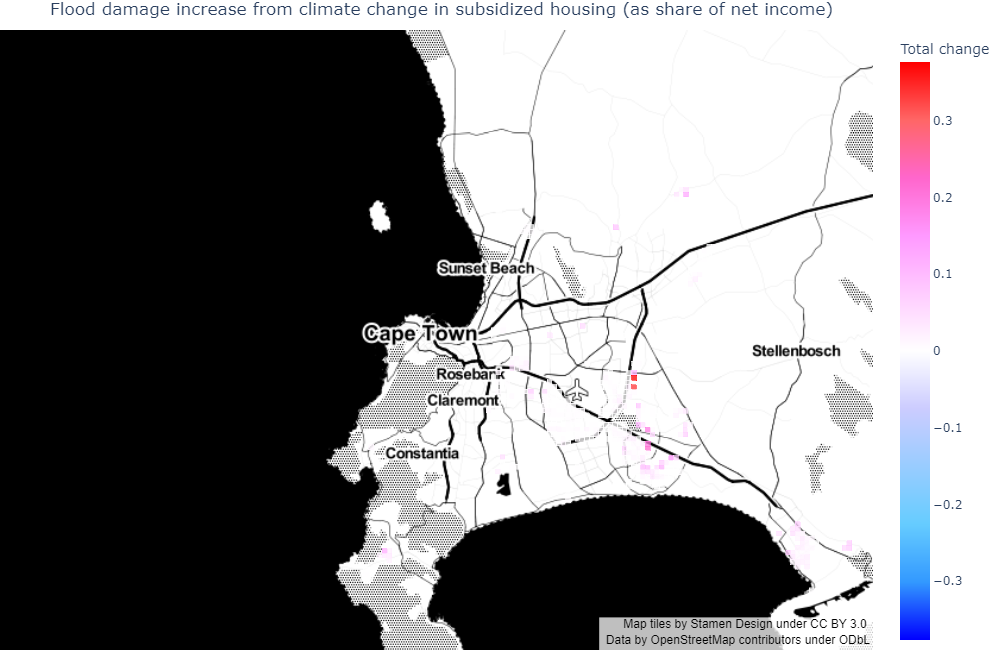

In [35]:
Image(path_outputs + 'use_case_cchange/maps/rel_damages/subsidized/map_damages_compar_subsidized.png')

Compared to the absolute damage map, we observe a relative peak in formal private relative damages South of Sunset Beach, and a relative trough near Rosebank and Claremont. It is simply because the first zone is populated by households from income group 3 and the second zone by households from income group 4.

In informal settlements, some damage values increase in Khayelitsha and North of Table Mountain National Park, but the largest changes occur North of Table Bay Nature Reserve: it is likely that households move from one point to another with close characteristics but less exposed to floods.

In informal backyards, damage values are increasing overall: they concentrate in Khayelitsha, Delft, and Strand, where households are likely to be restricted in their movements. Another interpretation is that the increase in flood risks is not large enough to reach a tipping point that makes households migrate.

In formal subsidized housing, households are immobile, and bear a more significant share of flood damages because of the relative importance of structure costs there. Damages are distributed in a similar way as for informal backyards, which suggests that backyarding might be a way for poor households to cope with such increasing costs.

#### Summary welfare statistics

As before, we plot the aggregate distribution of relative damages, this time for pluvial flood risks, which are dominant.

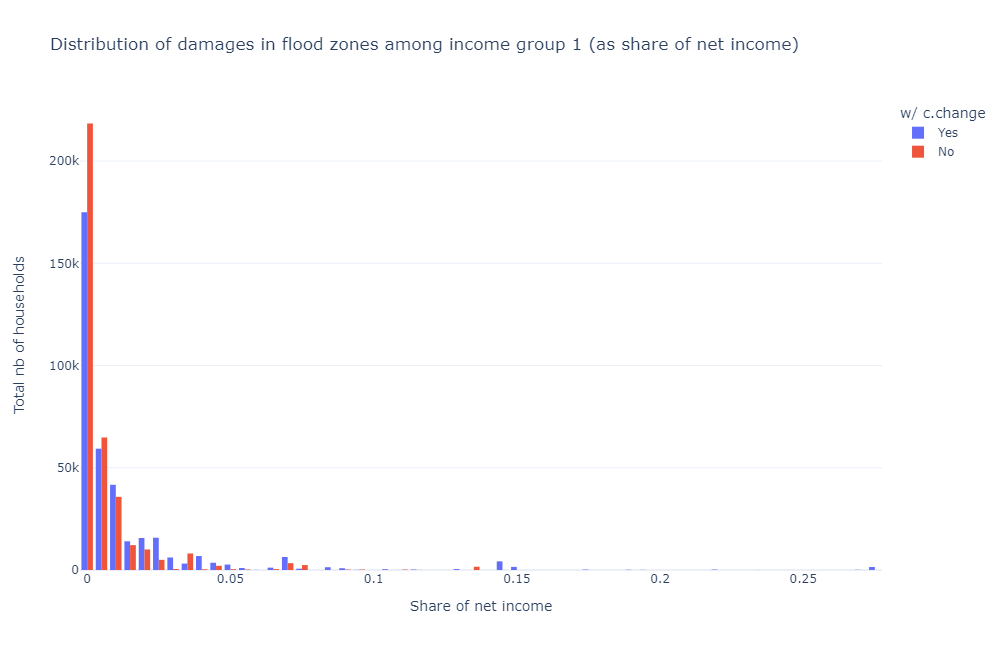

In [36]:
Image(path_outputs + 'use_case_cchange/charts/damage_distrib/total/pluvial_damage_dist_1_cchange_sum.png')

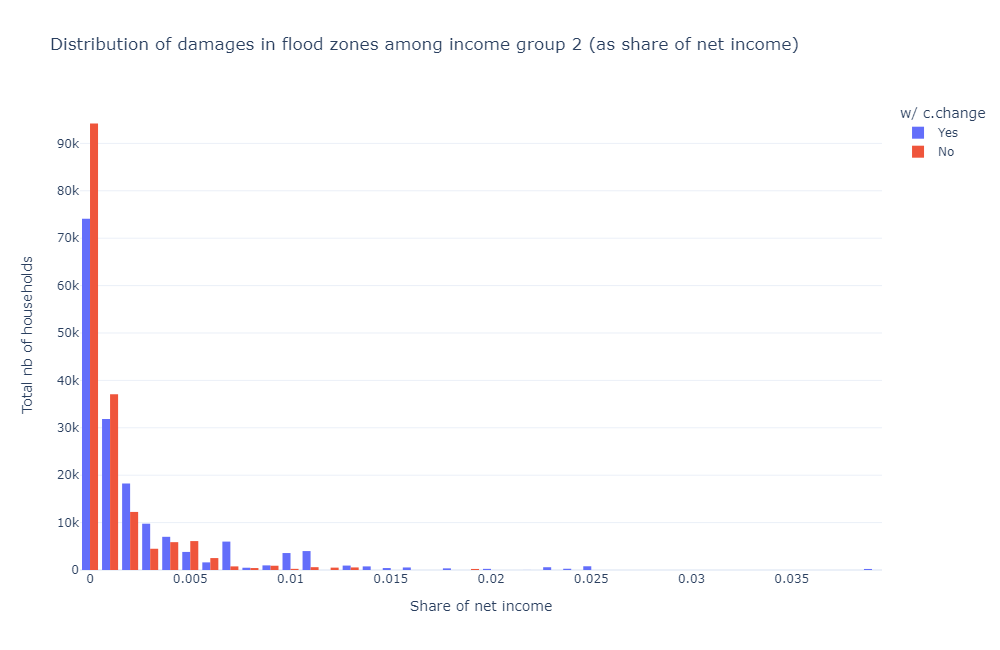

In [37]:
Image(path_outputs + 'use_case_cchange/charts/damage_distrib/total/pluvial_damage_dist_2_cchange_sum.png')

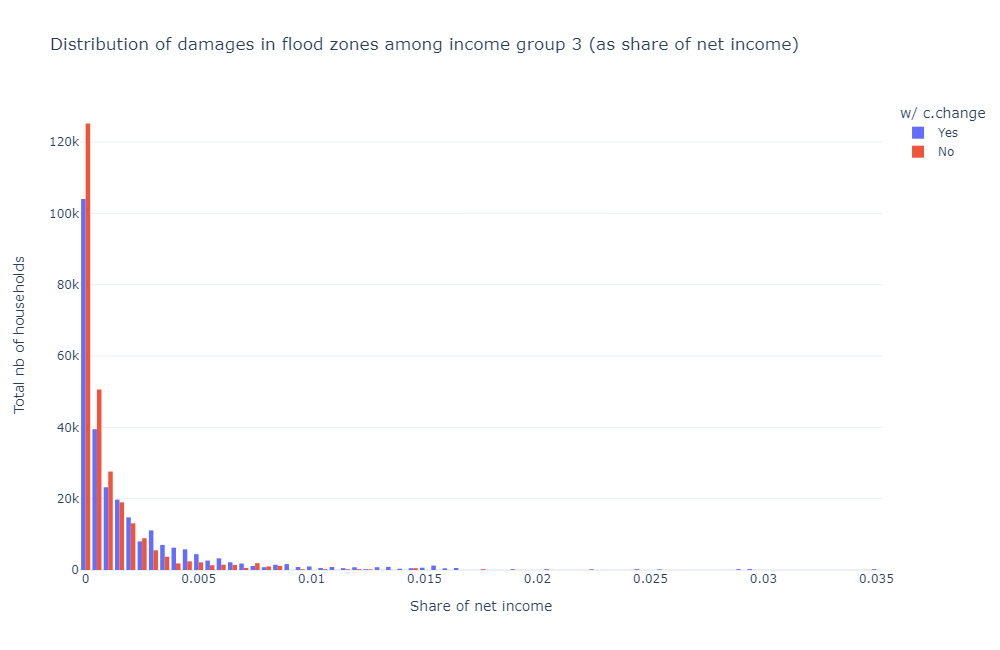

In [38]:
Image(path_outputs + 'use_case_cchange/charts/damage_distrib/total/pluvial_damage_dist_3_cchange_sum.png')

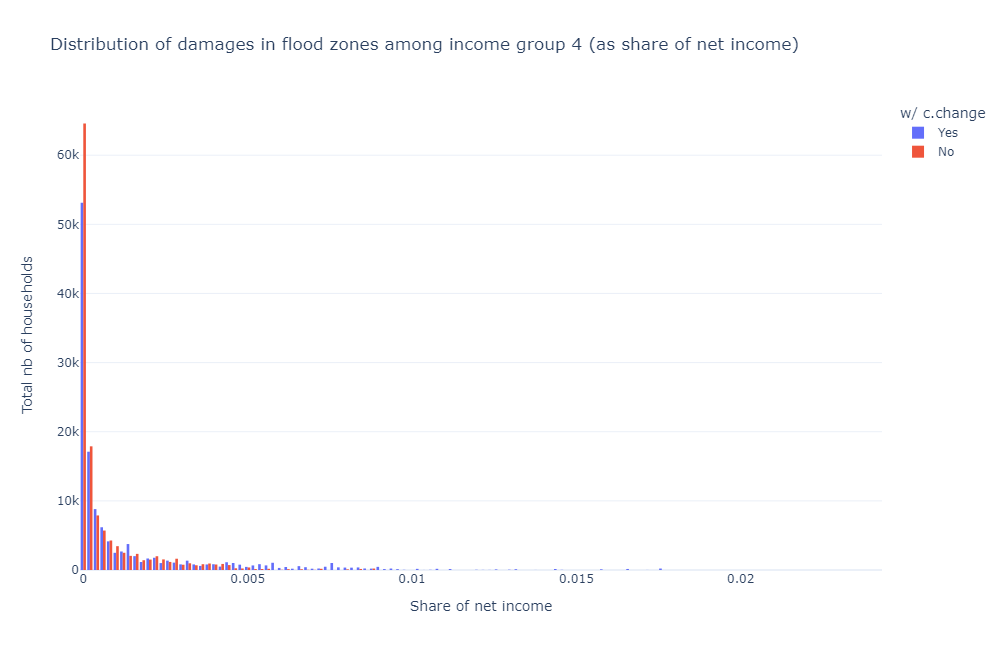

In [39]:
Image(path_outputs + 'use_case_cchange/charts/damage_distrib/total/pluvial_damage_dist_4_cchange_sum.png')

Compared to fluvial flood risks, there are more exposed households, and the tail is both thinner and shorter (if not for formal subsidized housing damages). As expected, we see exposure shifting from low-damage brackets to high-damage brackets when introducing climate change.

We also provide some back-of-the-envelope calculation to approximate the direct welfare impact of climate change (for pluvial flood risks only):

- Average damages go from 0.67% of net income (for 366,265 households) to 1.34% (for 364,492 households) for income group 1 (397,395 households in total) between the no-climate change and the climate change scenarios. Taking the exposed population in the no-climate change case as baseline (to include benefits to households who left flood-prone areas entirely), **this translates into a 0.67% loss in net income for 92% of the group population (or a 0.62% loss overall)**.
- Average damages go from 0.12% (for 166,655 households) to 0.23% (for 166,511 households) for income group 2 (172,435 households). **This translates into a 0.12% loss in net income for 97% of the group population (or a 0.11% loss overall)**.
- Average damages go from 0.10% (for 270,802 households) to 0.20% (for 270,786 households) for income group 3 (296,993 households). **This translates into a 0.10% loss in net income for 91% of the group population (or a 0.09% loss overall)**.
- Average damages go from 0.07% (for 128,747 households) to 0.13% (for 128,642 households) for income group 4 (162,676 households). **This translates into a 0.07% loss in net income for 79% of the group population (or a 0.05% loss overall)**.

#### Population moves and composition effect

Let us now focus on the relocation response.

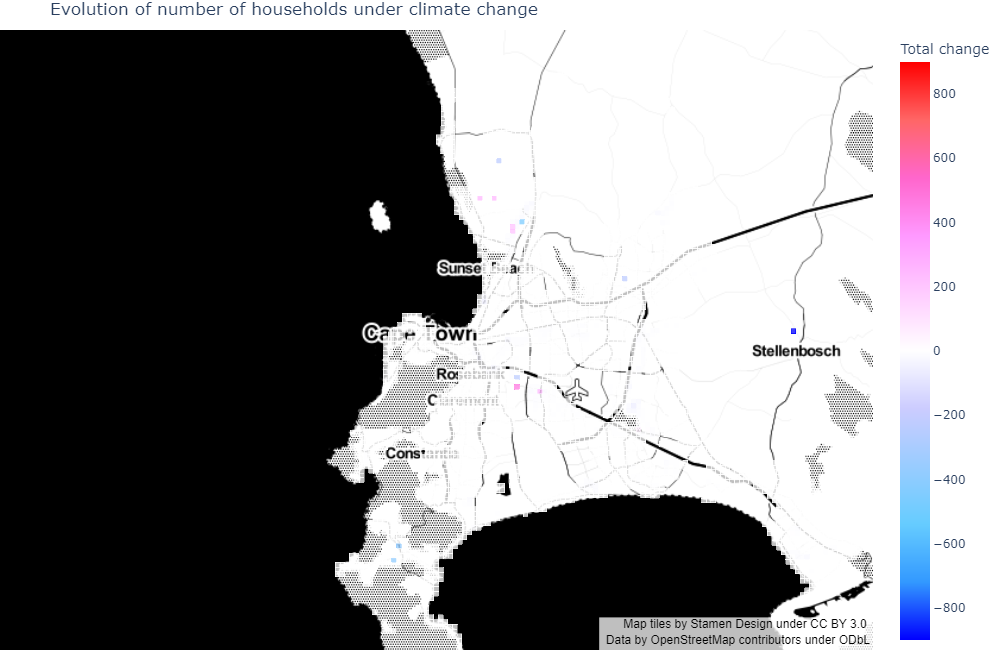

In [40]:
Image(path_outputs + 'use_case_cchange/maps/pop_distrib/map_pop_distrib_compar_cchange.png')

Main population outflows are spread out in specific locations in Stellenbosch, North of Table Mountain National Park, Athlone, Durbanville, and Bloubergstrand. Inflows concentrate in other areas of Athlone and Bloubergstrand. Overall, migrations remain limited in scope and do not seem to explain a significant share of damage changes under climate change.

#### Spatial sorting determinants and consumption adaptation

Let us now turn to the housing consumption response (again, we do not plot formal subsidized housing). 

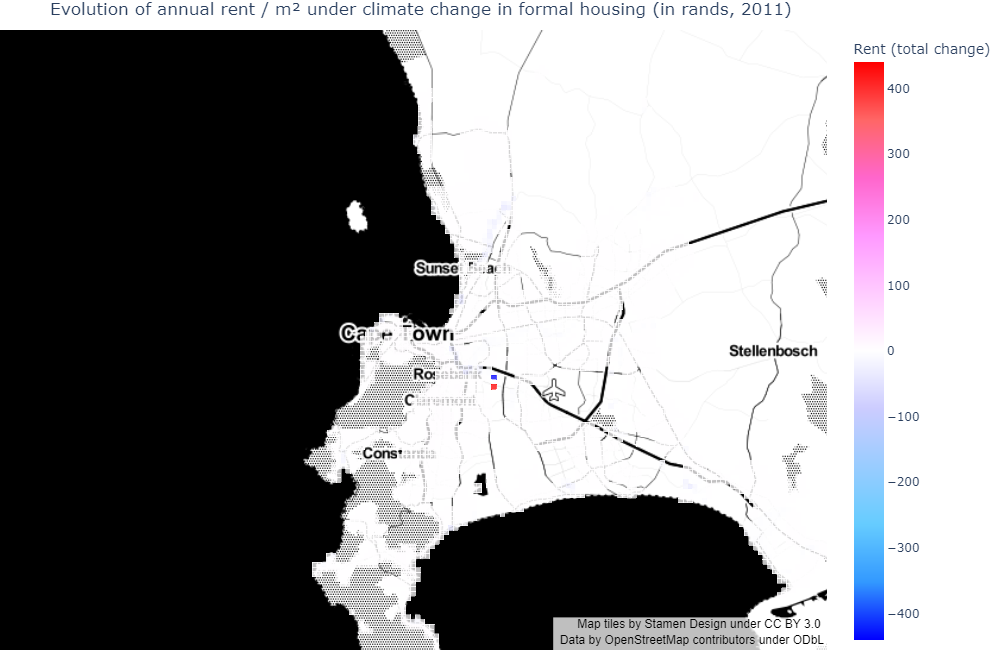

In [41]:
Image(path_outputs + 'use_case_cchange/maps/rent_distrib/formal/map_rent_distrib_compar_cchange_formal.png')

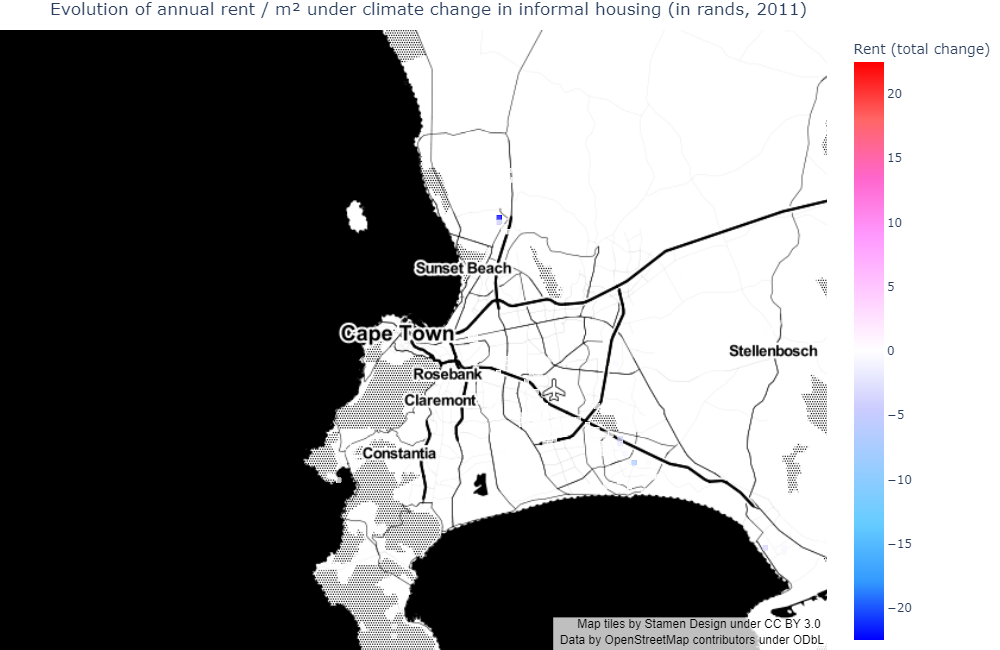

In [42]:
Image(path_outputs + 'use_case_cchange/maps/rent_distrib/informal/map_rent_distrib_compar_cchange_informal.png')

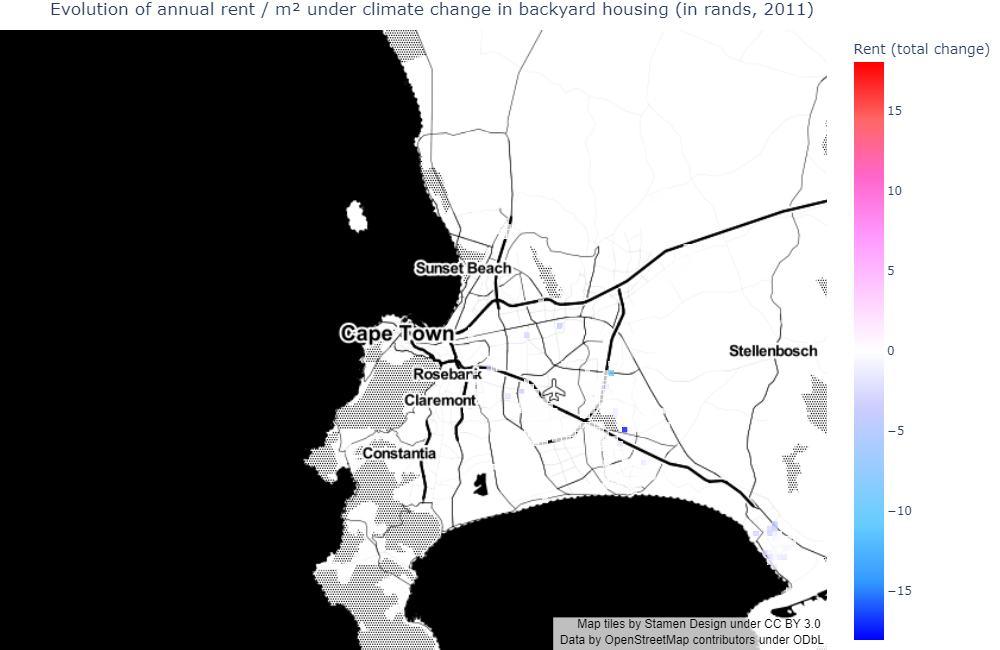

In [43]:
Image(path_outputs + 'use_case_cchange/maps/rent_distrib/backyard/map_rent_distrib_compar_cchange_backyard.png')

In formal private housing, we observe large changes in rents in Athlone migration areas: households leave flood-prone areas where rents decrease, and go to nearby unexposed places where rents increase. This masks less important (but still relevant) rent decreases East of the City Bowl and around Sunset Beach, following increases in flood risks. Those are not massive outmigration areas, and households do seem to increase their housing consumption in those locations. In other areas where rent does not change much, households incur the increased costs without relocating much.

In informal settlements, rent globally decreases, with troughs in Bloubergstrand and Khayelitsha. In the first zone, households move from one place to another to mitigate the rise in flood damages (as shown in the relative flood damage map). In the second zone, households do not seem to move much, and the rise in damages is mitigated by a fall in composite good consumption (as housing consumption cannot adapt). This is in line with the intuition that poor households are more sensitive to flood damages than rich households, hence adapt more, due to financial constraints.

Finally, in informal backyards, the fall in rents is more dispersed. Again, there does not seem to be a massive relocation response, and households essentially bear the increase in costs.

All in all, we observe the same types of adaptative behaviour as in the previous use case, with poor households who are more sensitive to income losses and essentially adapt through housing consumption rather than relocation.